# CIBERSORTx Results

In [1]:
import sys 
lab_path="/Users/andyzeng/Drive/Laptop/Dick_Lab/"
sys.path.append(lab_path+"scRNA_HSC/")
%load_ext rpy2.ipython

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline
import copy
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import anndata as ad
import scipy
import seaborn as sns
sc.set_figure_params(scanpy=True, dpi_save=200)
import scRNA_toolkit as tk
import jenkspy

In /Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /Users/andyzeng/opt/anaconda3

In [2]:
def load_TCGA(dem_path, anno_path = "Data/Fig2_Cohort_Deconvolution/TCGA_Clinical_anno.csv"):
    
    # load CIBERSORT output
    if "csv" in dem_path:
        dat = sc.read_csv(dem_path, delimiter=',')
    elif "txt" in dem_path:
        dat = sc.read_csv(dem_path, delimiter='\t')
    
    dat = dat[:,~dat.var_names.isin(['P-value', 'Correlation', 'RMSE', 'Absolute score (sig.score)'])]
    dat.obs.index.rename('patient', inplace=True)
    dat.obs_names = dat.obs_names.str.slice(0,12)
    anno = pd.read_csv(anno_path).set_index('patient')
    dat.obs = dat.obs.join(anno)
        
    # Absolute Scores
    absolute_scores = dat.to_df()
    absolute_scores.columns = absolute_scores.columns+'-Absolute'
    dat.obs = dat.obs.merge(absolute_scores, how = 'left', left_index=True, right_index=True)
    
    # Relative Scores (tumor only)
    relative_scores = dat.to_df()
    relative_scores = relative_scores.iloc[:,~relative_scores.columns.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry'])]
    relative_scores = (relative_scores.transpose() / relative_scores.sum(axis=1).transpose()).transpose()
    relative_scores.columns = relative_scores.columns+'-Relative'
    dat.obs = dat.obs.merge(relative_scores, how = 'left', left_index=True, right_index=True)

    return dat

In [3]:
def load_BEAT(dem_path, anno_path = "Data/Fig2_Cohort_Deconvolution/BEAT_Clinical_anno.csv", diagnosis_only = False):

    # load CIBERSORT output
    if "csv" in dem_path:
        dat = sc.read_csv(dem_path, delimiter=',')
    elif "txt" in dem_path:
        dat = sc.read_csv(dem_path, delimiter='\t')
    dat = dat[:,~dat.var_names.isin(['P-value', 'Correlation', 'RMSE', 'Absolute score (sig.score)'])]
    dat.obs.index.rename('Sample', inplace=True)
    anno = pd.read_csv(anno_path).set_index('Sample') 
    dat.obs = dat.obs.join(anno)
            
    if(diagnosis_only == True):
        dat = dat[dat.obs.specimenGroups == 'Initial Acute Leukemia Diagnosis']
        
    # Absolute Scores
    absolute_scores = dat.to_df()
    absolute_scores.columns = absolute_scores.columns+'-Absolute'
    dat.obs = dat.obs.merge(absolute_scores, how = 'left', left_index=True, right_index=True)
    
    # Relative Scores (tumor only)
    relative_scores = dat.to_df()
    relative_scores = relative_scores.iloc[:,~relative_scores.columns.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry'])]
    relative_scores = (relative_scores.transpose() / relative_scores.sum(axis=1).transpose()).transpose()
    relative_scores.columns = relative_scores.columns+'-Relative'
    dat.obs = dat.obs.merge(relative_scores, how = 'left', left_index=True, right_index=True)
    
    return dat

In [4]:
def load_Leucegene(dem_path, anno_path = "Data/Fig2_Cohort_Deconvolution/Leucegene_combined_anno_cleaned.csv"):
    
    def scale_series(series): 
        return((series - np.mean(series))/np.std(series))
    def scale_series_mad(series): 
        return((series - np.median(series))/scipy.stats.median_absolute_deviation(series))
    
    # load CIBERSORT output
    dat = sc.read_csv(dem_path)
    dat = dat[:,~dat.var_names.isin(['P-value', 'Correlation', 'RMSE', 'Absolute score (sig.score)'])]
    dat.obs.index.rename('Sample', inplace=True)
    dat.obs_names = [x[1] for x in dat.obs_names.str.split("_")]

    anno = pd.read_csv(anno_path,  encoding = "cp1252").set_index("Sample")
    anno = anno.groupby('Sample').first() # take non-NA value for redundant samples
    dat.obs = dat.obs.merge(anno, how='left', left_index=True, right_index=True)    
    
    # Absolute Scores
    absolute_scores = dat.to_df()
    absolute_scores.columns = absolute_scores.columns+'-Absolute'
    dat.obs = dat.obs.merge(absolute_scores, how = 'left', left_index=True, right_index=True)
    
    # Relative Scores (tumor only)
    relative_scores = dat.to_df()
    relative_scores = relative_scores.iloc[:,~relative_scores.columns.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry'])]
    relative_scores = (relative_scores.transpose() / relative_scores.sum(axis=1).transpose()).transpose()
    relative_scores.columns = relative_scores.columns+'-Relative'
    dat.obs = dat.obs.merge(relative_scores, how = 'left', left_index=True, right_index=True)

    return dat

In [5]:
%%R -w 8 -h 4 --units in -r 200
require("survival")
library(tidyverse)
library(ggpubr)
library(survminer)

R[write to console]: Loading required package: survival

R[write to console]: ── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

R[write to console]: ✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.2     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

R[write to console]: ── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



# Fractions

In [6]:
celltypes = ['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like']#, 'B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry']
#celltypes = ['LSPC-MYC', 'LSPC-TNF', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like']

def process_fractions(adata, res=0.5, cohort = 'TCGA'):
    
    adata = adata[:,~adata.var_names.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry'])]
    adata.X = (adata.X.transpose() / adata.X.sum(axis=1)).transpose()

    sc.pp.pca(adata, n_comps=5)
    sc.pp.neighbors(adata, n_neighbors=10, )
    sc.tl.leiden(adata, resolution = res)
    sc.tl.umap(adata)
    
    sc.pl.pca(adata, color=['leiden']+celltypes, color_map = 'RdBu_r', wspace = 0.3, ncols=4)
    
    return(adata)

# TCGA

In [56]:
tcga = load_TCGA("Data/Fig2_Cohort_Deconvolution/CIBERSORTx_Results_TCGA.csv")
tcga

AnnData object with n_obs × n_vars = 173 × 14
    obs: 'patient_id', 'vital_status', 'days_to_death', 'days_to_last_followup', 'patient.molecular_analysis_abnormality_testing_results.molecular_analysis_abnormality_testing_result_values.molecular_analysis_abnormality_testing_result', 'acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'leukemia_french_american_british_morphology_code', 'age_at_initial_pathologic_diagnosis', 'atra_exposure', 'cytogenetic_abnormality', 'cytogenetic_abnormality-2', 'cytogenetic_abnormality-3', 'cytogenetic_abnormality-4', 'cytogenetic_abnormality_other', 'days_to_birth', 'days_to_initial_pathologic_diagnosis', 'gender', 'history_of_neoadjuvant_treatment', 'hydroxyurea_administration_prior_registration_clinical_study_indicator', 'hydroxyurea_agent_administered_day_count', 'lab_procedure_abnormal_lymphocyte_result_percent_value', 'lab_procedure_blast_cell_outcome_percentage_value', 'lab_procedure_bone_marrow_band_cell_result_percent_value', 'lab_proce

... storing 'vital_status' as categorical
... storing 'patient.molecular_analysis_abnormality_testing_results.molecular_analysis_abnormality_testing_result_values.molecular_analysis_abnormality_testing_result' as categorical
... storing 'acute_myeloid_leukemia_calgb_cytogenetics_risk_category' as categorical
... storing 'leukemia_french_american_british_morphology_code' as categorical
... storing 'atra_exposure' as categorical
... storing 'cytogenetic_abnormality' as categorical
... storing 'cytogenetic_abnormality-2' as categorical
... storing 'cytogenetic_abnormality-3' as categorical
... storing 'cytogenetic_abnormality-4' as categorical
... storing 'cytogenetic_abnormality_other' as categorical
... storing 'gender' as categorical
... storing 'history_of_neoadjuvant_treatment' as categorical
... storing 'hydroxyurea_administration_prior_registration_clinical_study_indicator' as categorical
... storing 'race' as categorical
... storing 'patient.fish_test_component_results.fish_test_c

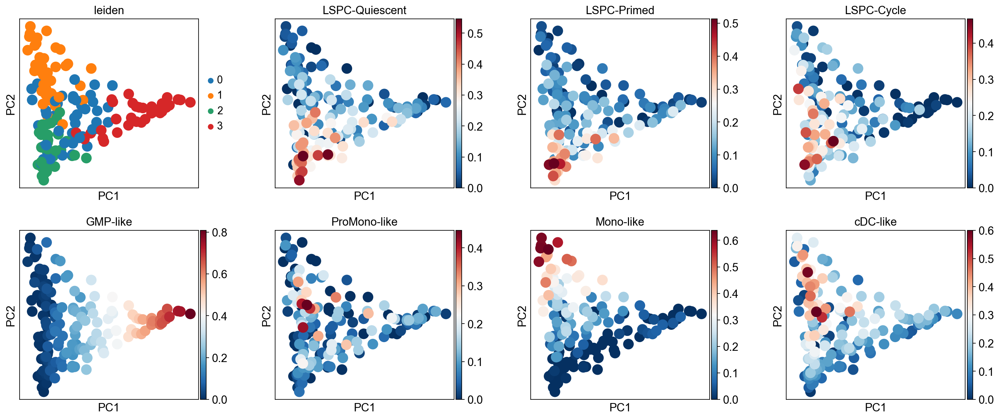

In [57]:
tcga = process_fractions(tcga, res=0.4)

In [37]:
tcga.obs['PC1'] = tcga.obsm['X_pca'][:,0]
tcga.obs['PC2'] = tcga.obsm['X_pca'][:,1]
tcga.obs['PC3'] = tcga.obsm['X_pca'][:,2]
tcga.obs['PC4'] = tcga.obsm['X_pca'][:,3]
tcga.obs['PC5'] = tcga.obsm['X_pca'][:,4]

In [38]:
tcga_obs = tcga.obs

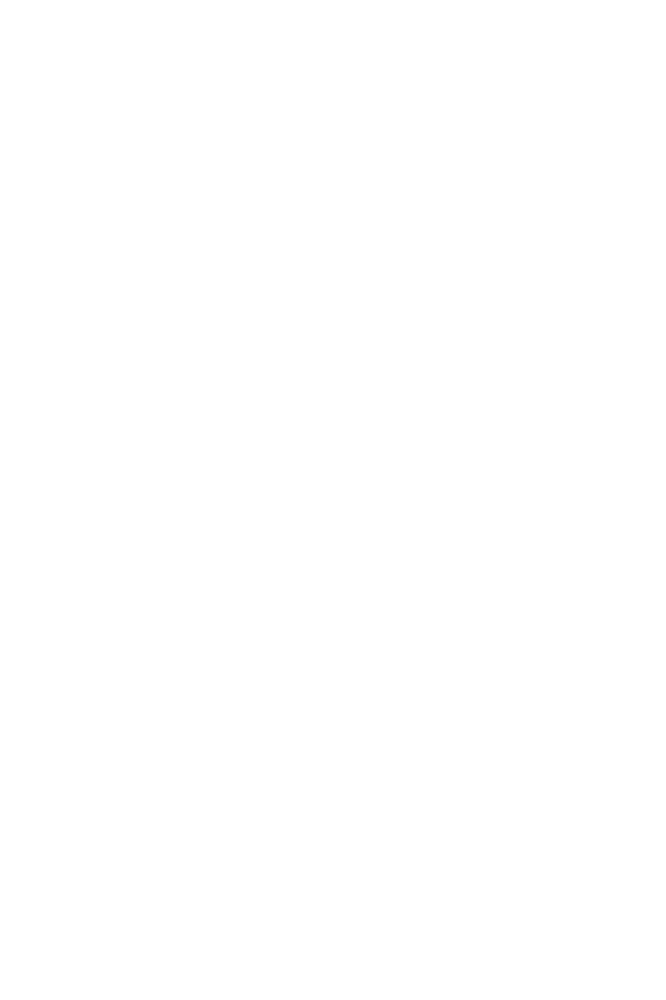

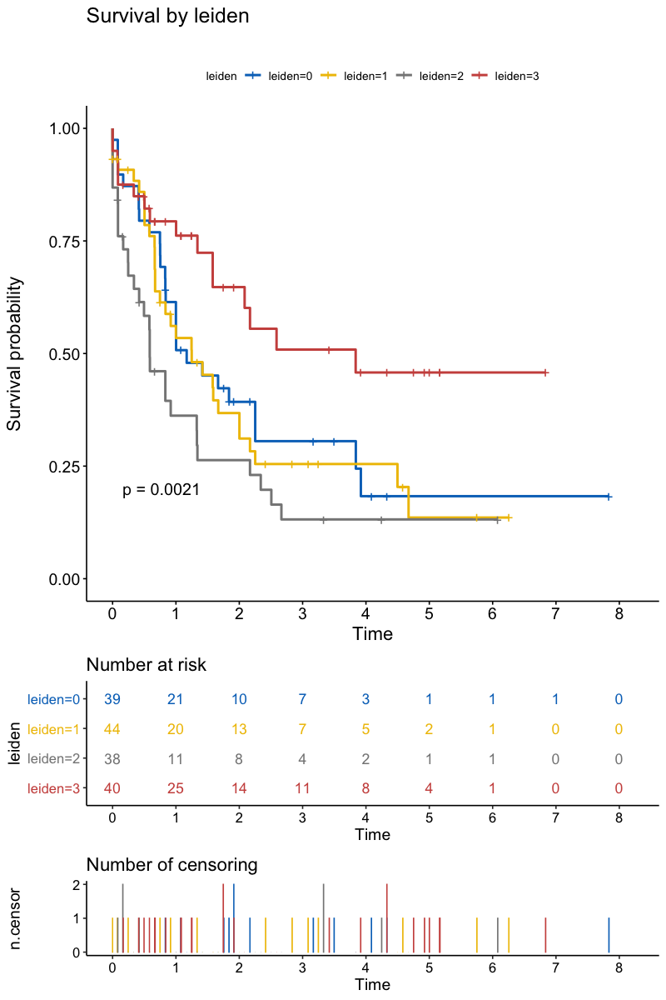

In [39]:
%%R -i tcga_obs --units in -r 100 -w 8 -h 12 

# convert factors to chr
indx <- sapply(tcga_obs, is.factor)
tcga_obs[indx] <- lapply(tcga_obs[indx], function(x) as.character(x))
# set time and status
tcga_obs <- tcga_obs %>% 
    mutate(time = if_else(vital_status == "dead", days_to_death, days_to_last_followup) %>% as.numeric(), 
          status = if_else(vital_status == "dead", 1, 0))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, # legend.labs = labels, 
               palette = 'jco', pval = TRUE, 
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}

# Fit survival curves
survfit(Surv(time, status) ~ leiden, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "leiden")

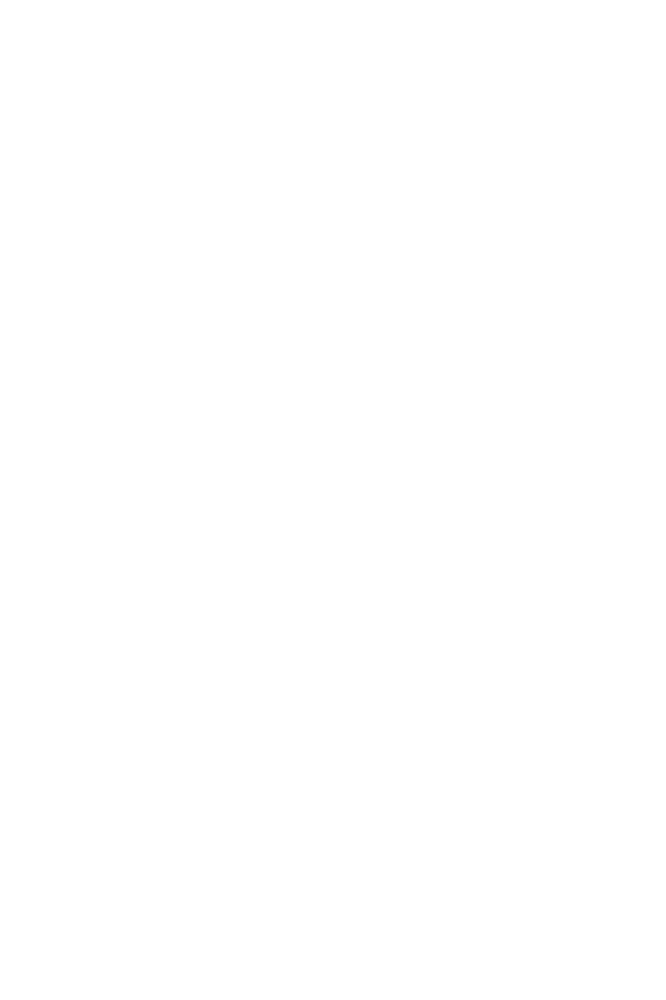

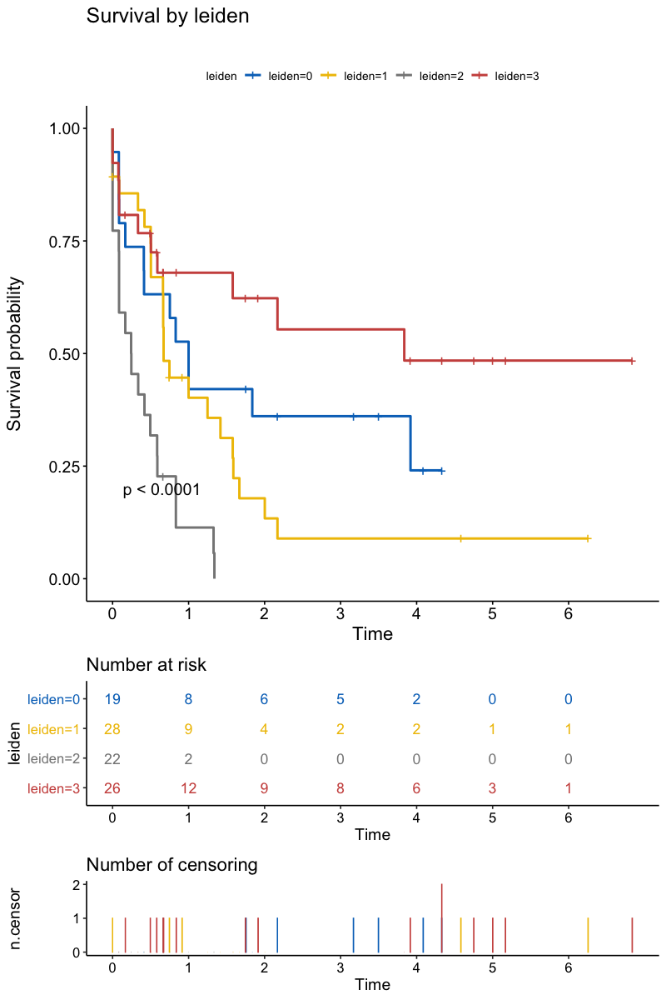

In [41]:
%%R -w 8 -h 12 --units in -r 100

survfit(Surv(time, status) ~ leiden, data = tcga_obs %>% filter(`Transplant Type` == 0), type = 'kaplan-meier') %>% get_survplot(., "leiden")

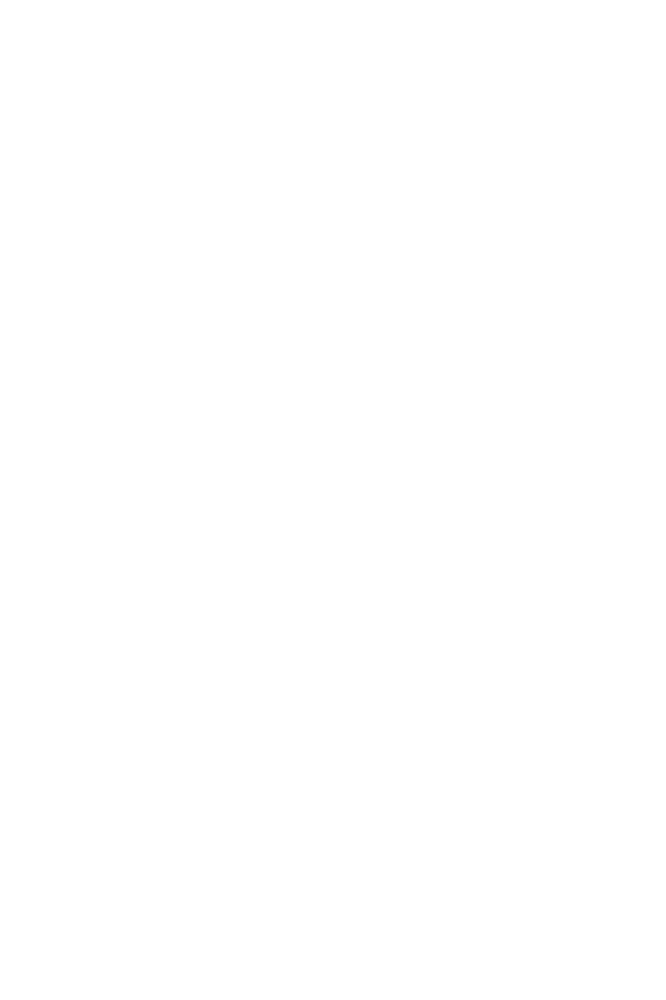

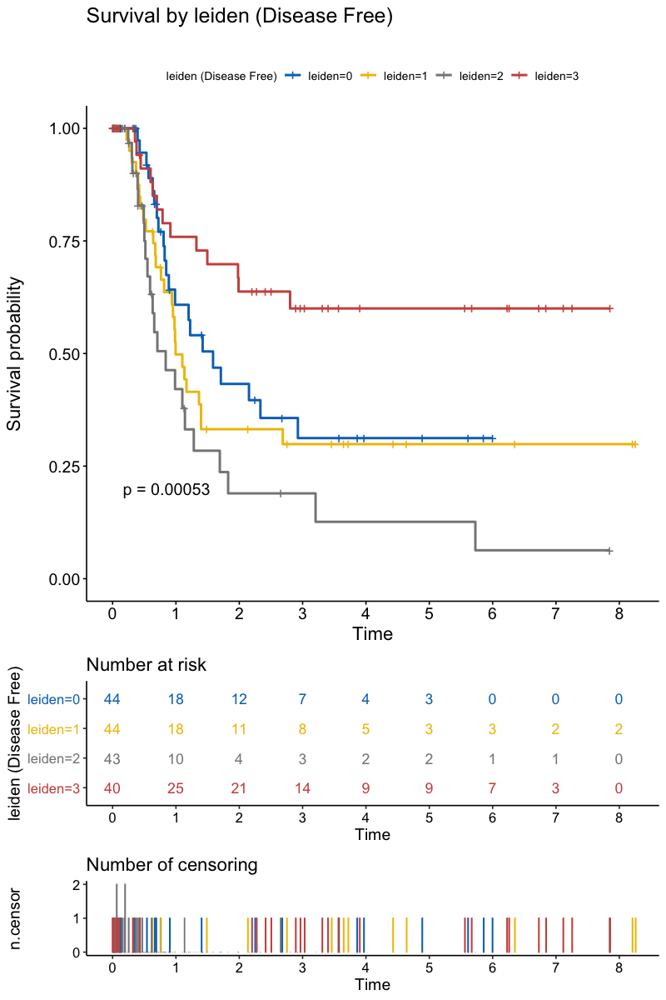

In [43]:
%%R -i tcga_obs -w 8 -h 12 --units in -r 100

# convert factors to chr
indx <- sapply(tcga_obs, is.factor)
tcga_obs[indx] <- lapply(tcga_obs[indx], function(x) as.character(x))
# set time and status
tcga_obs <- tcga_obs %>% 
    mutate(time = (`Disease Free (Months)` %>% as.numeric()) * 30, 
          status = if_else(`Disease Free Status` == "Recurred/Progressed", 1, 0))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, # legend.labs = labels, 
               palette = 'jco', pval = TRUE, 
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}

# Fit survival curves
survfit(Surv(time, status) ~ leiden, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "leiden (Disease Free)")

In [61]:
pd.DataFrame(tcga.varm['PCs'], columns= ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'], index=tcga.var.index).loc[['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like']]\
    .style.background_gradient(cmap='RdBu_r')

,PC1,PC2,PC3,PC4,PC5
LSPC-Quiescent,-0.130008,-0.445455,0.359049,-0.662625,0.239360
LSPC-Primed,-0.134022,-0.419028,-0.271446,0.186583,-0.684179
LSPC-Cycle,-0.226961,-0.218507,-0.423027,0.155879,0.304410
GMP-like,0.905608,0.074718,-0.110061,-0.101948,-0.036131
ProMono-like,-0.020577,0.033559,0.064083,0.529373,0.539444
Mono-like,-0.284888,0.707014,-0.323835,-0.374127,-0.072397
cDC-like,-0.109151,0.267699,0.705237,0.266865,-0.290507


In [62]:
%%R 

res.cox <- coxph(Surv(time, status) ~  `LSPC-Quiescent-Absolute` + `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + 
                 `GMP-like-Absolute` + `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute` 
                ,data = tcga_obs)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ `LSPC-Quiescent-Absolute` + 
    `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + `GMP-like-Absolute` + 
    `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute`, 
    data = tcga_obs)

  n= 161, number of events= 103 
   (12 observations deleted due to missingness)

                              coef exp(coef) se(coef)      z Pr(>|z|)   
`LSPC-Quiescent-Absolute`  0.46798   1.59676  0.20180  2.319  0.02039 * 
`LSPC-Primed-Absolute`    -0.12141   0.88567  0.25223 -0.481  0.63028   
`LSPC-Cycle-Absolute`      0.11316   1.11982  0.21808  0.519  0.60383   
`GMP-like-Absolute`       -0.35971   0.69788  0.11677 -3.080  0.00207 **
`ProMono-like-Absolute`    0.02638   1.02673  0.18107  0.146  0.88418   
`Mono-like-Absolute`      -0.13961   0.86970  0.10786 -1.294  0.19553   
`cDC-like-Absolute`        0.32956   1.39036  0.15433  2.135  0.03272 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

                     

In [72]:
%%R 

res.cox <- coxph(Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + PC5
                ,data = tcga_obs)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + 
    PC5, data = tcga_obs)

  n= 161, number of events= 103 
   (12 observations deleted due to missingness)

       coef exp(coef) se(coef)      z Pr(>|z|)    
PC1 -2.0096    0.1340   0.5149 -3.903 9.49e-05 ***
PC2 -0.7624    0.4665   0.4916 -1.551   0.1209    
PC3  2.3372   10.3519   0.6895  3.389   0.0007 ***
PC4 -0.3250    0.7225   0.8181 -0.397   0.6912    
PC5  0.6607    1.9361   1.0003  0.660   0.5089    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

    exp(coef) exp(-coef) lower .95 upper .95
PC1    0.1340     7.4606   0.04886    0.3677
PC2    0.4665     2.1434   0.17801    1.2227
PC3   10.3519     0.0966   2.67968   39.9907
PC4    0.7225     1.3840   0.14537    3.5912
PC5    1.9361     0.5165   0.27257   13.7516

Concordance= 0.666  (se = 0.03 )
Likelihood ratio test= 30.55  on 5 df,   p=1e-05
Wald test            = 27.51  on 5 df,   p=5e-05
Score (logrank) test = 29.29  on 5 df,   p=2e-0

## Matrixplot

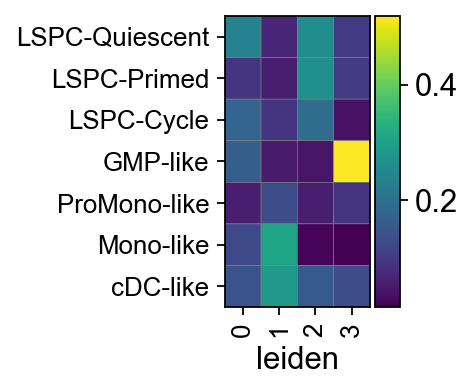

GridSpec(2, 3, height_ratios=[0, 1.4000000000000001], width_ratios=[1.2, 0, 0.2])

In [102]:
sc.pl.matrixplot(tcga, var_names=celltypes, groupby='leiden', swap_axes=True)

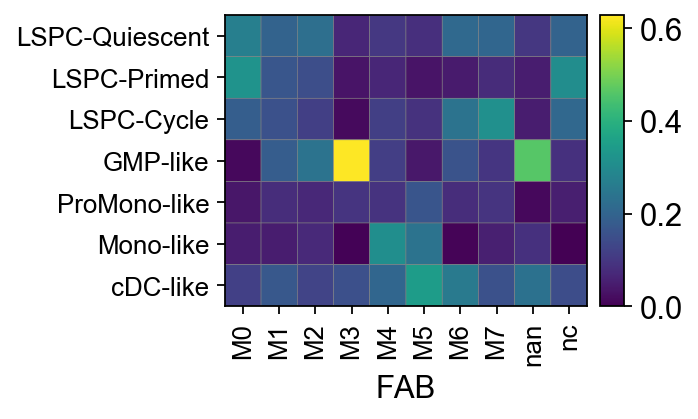

GridSpec(2, 3, height_ratios=[0, 1.4000000000000001], width_ratios=[3.0, 0, 0.2])

In [98]:
sc.pl.matrixplot(tcga, var_names=celltypes, groupby='FAB', swap_axes=True)

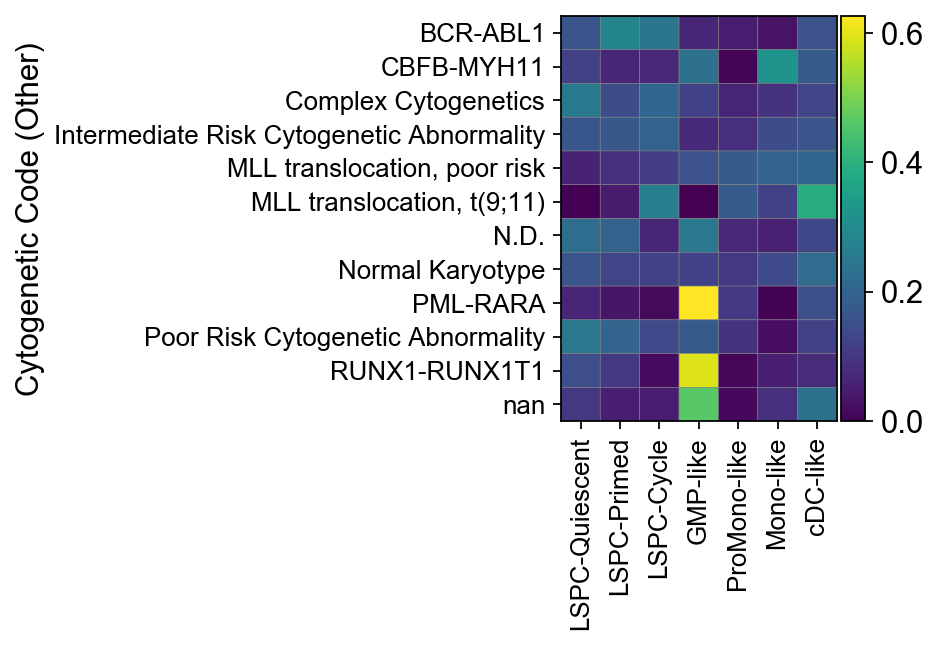

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.24, 0, 0.2])

In [99]:
sc.pl.matrixplot(tcga, var_names=celltypes, groupby='Cytogenetic Code (Other)')

## Violin Plots

In [61]:
from seaborn.categorical import _ViolinPlotter

class MyVPlot(_ViolinPlotter):
    def draw_quartiles(self, ax, data, support, density, center, split=False):
        """Draw the quartiles as lines at width of density."""
        q25, q50, q75 = np.percentile(data, [25, 50, 75])
        self.draw_to_density(ax, center, q50, support, density, split,
                             linewidth=self.linewidth, )

def my_violinplot(x=None, y=None, hue=None, data=None, order=None, hue_order=None,
                  bw="scott", cut=2, scale="area", scale_hue=True, gridsize=100,
                  width=.8, inner="box", split=False, dodge=True, orient=None,
                  linewidth=None, color=None, palette=None, saturation=.75,
                  ax=None, **kwargs):
    plotter = MyVPlot(x, y, hue, data, order, hue_order,
                      bw, cut, scale, scale_hue, gridsize,
                      width, inner, split, dodge, orient, linewidth,
                      color, palette, saturation)
    if ax is None:
        ax = plt.gca()
    plotter.plot(ax)
    return ax

def violin_category(data, category, score, xlab = None, ylab = None, order=["Low", "High"], boxpairlist=[("Low", "High")], textformat = "star", swarm=True, swarmsize=5):
    data = data.obs
    p1 = my_violinplot(data = data, x = category, y = score, scale='width', order=order, inner="quartile")
    if swarm==True:
        p1 = sns.swarmplot(data = data, x = category, y = score, order=order, color="black", size = swarmsize)
    add_stat_annotation(p1, data=data, x= category, y= score, order=order, box_pairs=boxpairlist,
                        test='t-test_ind', text_format= textformat, loc='outside', verbose=0)
    if xlab != None:
        plt.xlabel(xlab)
    if ylab != None:
        plt.ylabel(ylab)
    sns.despine()

In [104]:
tcga.obs['Age65'] = np.where(tcga.obs['Diagnosis Age'] >= 65, "Over 65", "Under 65")

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 18.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 21.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


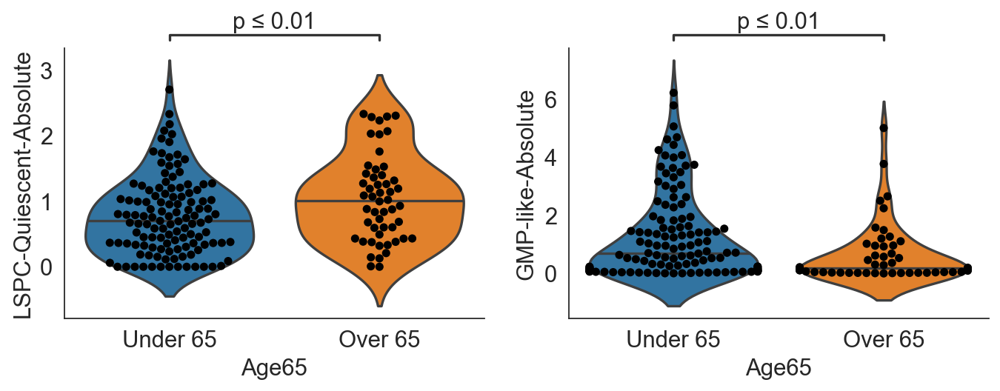

In [115]:
sns.set_style('white')
plt.figure(figsize=[10,3])
plt.subplot(1,2,1)
violin_category(tcga, 'Age65', 'LSPC-Quiescent-Absolute', order=['Under 65', 'Over 65'], boxpairlist=[('Under 65', 'Over 65')], textformat='simple')
plt.subplot(1,2,2)
violin_category(tcga, 'Age65', 'GMP-like-Absolute', order=['Under 65', 'Over 65'], boxpairlist=[('Under 65', 'Over 65')], textformat='simple')

## Cytogenetics

In [141]:
cyto=tcga.obs.iloc[:,tcga.obs.columns.str.contains('cytogenetic_abnormality')].reset_index()
cyto=cyto.melt(id_vars='patient').drop(columns=['variable'])
cyto['count']=1
cyto=cyto.pivot_table(values='count',columns='value', index='patient').fillna(0).drop(columns=['nan', 'no', 'yes'])
cyto = cyto.replace(0, 'no').replace(1, 'yes')
tcga.obs=tcga.obs.merge(cyto, left_index=True, right_index=True)

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 18.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 18.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 18.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


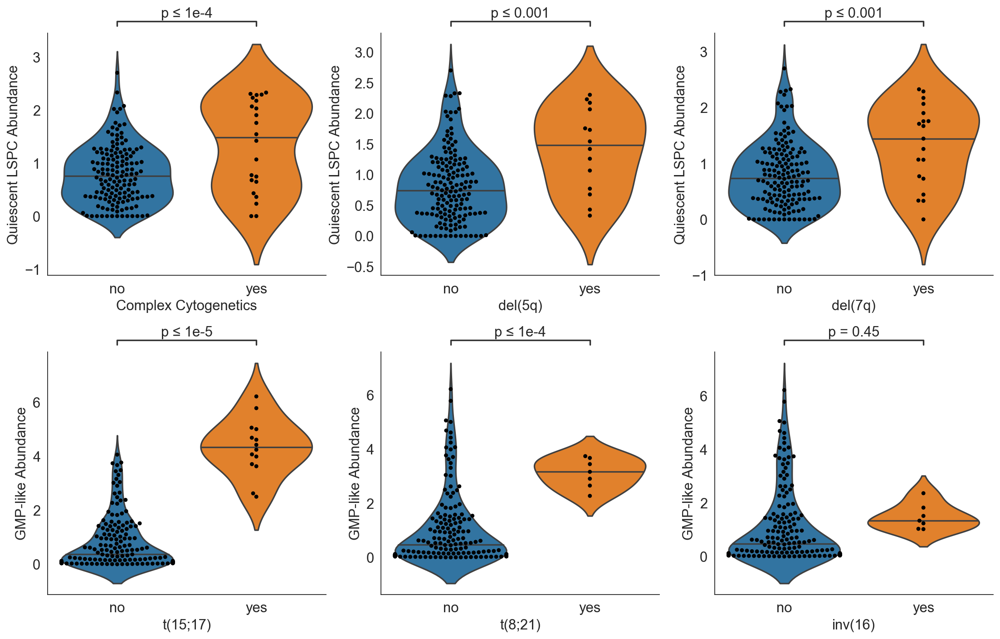

In [143]:
sns.set_style('white')
plt.rcParams['figure.figsize'] = [14,9]

plt.subplot(2,3,1)
violin_category(tcga, category='complex - >= 3 distinct abnormalities', xlab='Complex Cytogenetics',
                   score='LSPC-Quiescent-Absolute', ylab='Quiescent LSPC Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.subplot(2,3,2)
violin_category(tcga, category='del(5q) / 5q-', xlab='del(5q)',
                   score='LSPC-Quiescent-Absolute', ylab='Quiescent LSPC Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.subplot(2,3,3)
violin_category(tcga, category='del(7q) / 7q-', xlab='del(7q)',
                   score='LSPC-Quiescent-Absolute', ylab='Quiescent LSPC Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.subplot(2,3,4)
violin_category(tcga, category='t(15;17) and variants', xlab='t(15;17)',
                   score='GMP-like-Absolute', ylab='GMP-like Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.subplot(2,3,5)
violin_category(tcga, category='t(8;21)', xlab='t(8;21)',
                   score='GMP-like-Absolute', ylab='GMP-like Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.subplot(2,3,6)
violin_category(tcga, category='inv(16)', xlab='inv(16)',
                   score='GMP-like-Absolute', ylab='GMP-like Abundance', order=['no', 'yes'], boxpairlist=[('no', 'yes')], textformat='simple', swarmsize=4)
plt.tight_layout()

## LSC17 Correlation

In [144]:
obs_celltype_correlations(tcga, "LSC17_Score")

,pearson,pvalue,qvalue
CellType_Enrichment,,,
LSPC-Quiescent-Absolute,0.611329,4.149066e-19,2.904346e-18
GMP-like-Absolute,-0.309440,3.432710e-05,1.201448e-04
LSPC-Primed-Absolute,0.258118,6.065078e-04,1.415185e-03
ProMono-like-Absolute,-0.185664,1.445988e-02,2.530478e-02
LSPC-Cycle-Absolute,0.090457,2.365778e-01,3.312089e-01
Mono-like-Absolute,-0.059803,4.344569e-01,4.945925e-01
cDC-like-Absolute,-0.052273,4.945925e-01,4.945925e-01


# BEAT-AML

In [ ]:
beat = load_BEAT("Data/Fig2_Cohort_Deconvolution/CIBERSORTx_Results_BEAT.csv", diagnosis_only = True)

... storing 'consensus_sex' as categorical
... storing 'inferred_sex' as categorical
... storing 'inferred_ethnicity' as categorical
... storing 'CEBPA_Biallelic' as categorical
... storing 'finalFusion' as categorical
... storing 'priorMalignancyNonMyeloid' as categorical
... storing 'priorMalignancyType' as categorical
... storing 'cumulativeChemo' as categorical
... storing 'priorMalignancyRadiationTx' as categorical
... storing 'priorMDS' as categorical
... storing 'priorMDSMoreThanTwoMths' as categorical
... storing 'priorMDSMPN' as categorical
... storing 'priorMDSMPNMoreThanTwoMths' as categorical
... storing 'priorMPN' as categorical
... storing 'priorMPNMoreThanTwoMths' as categorical
... storing 'Classification' as categorical
... storing 'dxAtInclusion' as categorical
... storing 'specificDxAtInclusion' as categorical
... storing 'ELN2017' as categorical
... storing 'ELN2008' as categorical
... storing 'dxAtSpecimenAcquisition' as categorical
... storing 'specificDxAtAcquisi

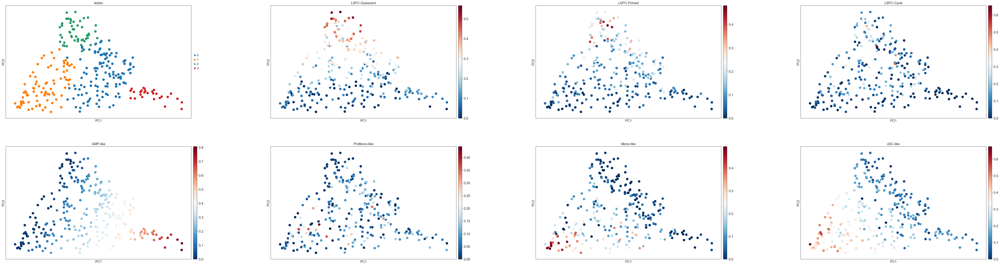

In [146]:
beat = process_fractions(beat, res = 0.25)

In [730]:
df = pd.DataFrame()
beat_copy = beat.copy()

for res in np.linspace(0.1,1,19): 
    sc.tl.leiden(beat_copy, resolution = res)
    df = df.append(pd.DataFrame.from_dict({'resolution' : res, 
                                           'n_clusters' : beat_copy.obs['leiden'].value_counts().shape[0],
                                           'PCA_silhouette' : silhouette_score(beat_copy.obsm['X_pca'], beat_copy.obs['leiden']), 
                                           'X_silhouette' : silhouette_score(beat_copy.to_df(), beat_copy.obs['leiden'])
                                          }, orient='index').T)
    
df

,resolution,n_clusters,PCA_silhouette,X_silhouette
0,0.10,2.0,0.261710,0.250774
0,0.15,3.0,0.230193,0.219029
0,0.20,3.0,0.256820,0.245084
0,0.25,4.0,0.233092,0.220503
0,0.30,5.0,0.235241,0.219697
0,0.35,5.0,0.235241,0.219697
0,0.40,7.0,0.215795,0.198304
0,0.45,7.0,0.215795,0.198304
0,0.50,7.0,0.215795,0.198304
0,0.55,7.0,0.224864,0.205929


In [156]:
beat.obs['qLSPC_median'] = np.where(beat.obs['LSPC-Quiescent-Absolute'] > np.median(beat.obs['LSPC-Quiescent-Absolute']), 'High', 'Low')

In [157]:
beat_obs = beat.obs

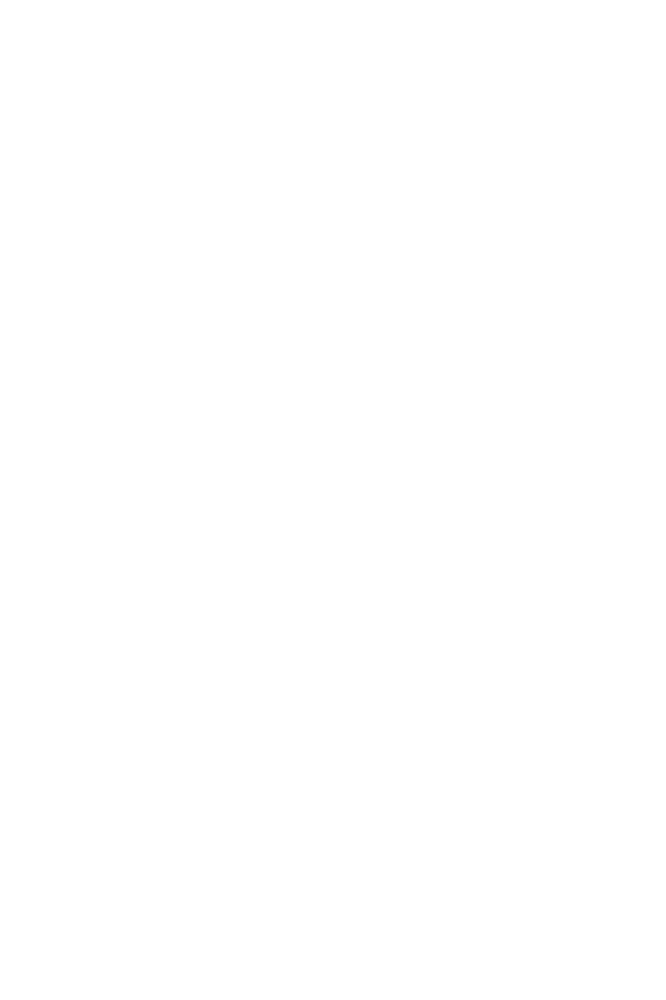

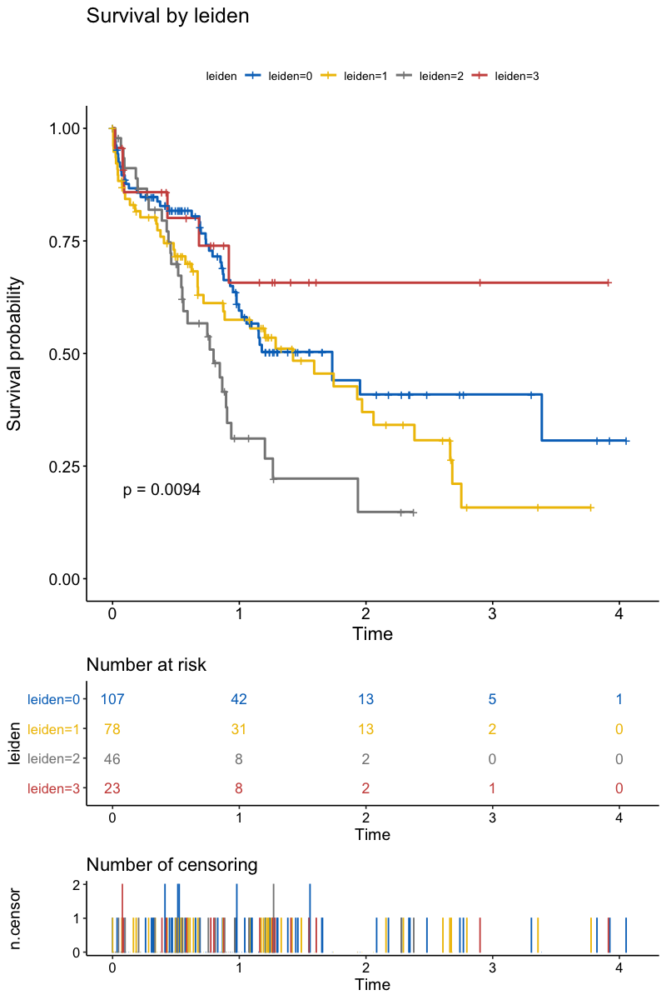

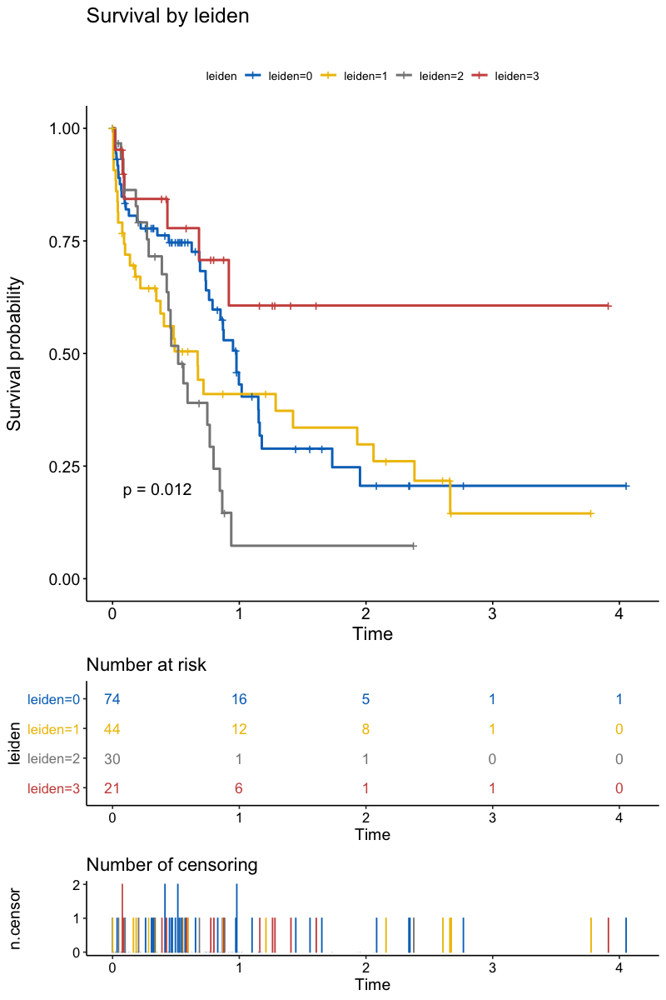

In [170]:
%%R -i beat_obs -w 8 -h 12 --units in -r 100

# convert factors to chr
indx <- sapply(beat_obs, is.factor)
beat_obs[indx] <- lapply(beat_obs[indx], function(x) as.character(x))
# set time and status
beat <- beat_obs %>% 
    mutate(time = overallSurvival %>% as.numeric(), 
          status = if_else(vitalStatus == "Dead", 1, 0))
    
    
get_survplot <- function(fit, cat_name){
    # Drawing curves
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.15,
               legend.title = cat_name,# legend.labs = labels, 
               palette = 'jco', pval = TRUE, 
               #palette = c('#6E6E6E', '#ffb241', '#1f77b4', '#d62728'), pval = TRUE, 
               #conf.int = TRUE, conf.int.style = "step", 
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
#     ggsave(paste0("Figures/BEAT-AML_Survival_by_", cat_name, ".png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)

}

beat <- beat %>% mutate(Therapy = if_else(cumulativeTreatmentTypes %>% str_detect('Transplant'), 'Transplant', 
                                      if_else(cumulativeTreatmentTypes %>% str_detect('Target'), 'Targeted', 'Chemotherapy')))

survfit(Surv(time, status) ~ leiden, data = beat, type = 'kaplan-meier') %>% get_survplot(., "leiden")#, c("GMP", "Intermediate", "Mature", "Primitive"))
survfit(Surv(time, status) ~ leiden, data = beat %>% filter(Therapy != 'Transplant'), type = 'kaplan-meier') %>% get_survplot(., "leiden")#, c("GMP", "Intermediate", "Mature", "Primitive"))

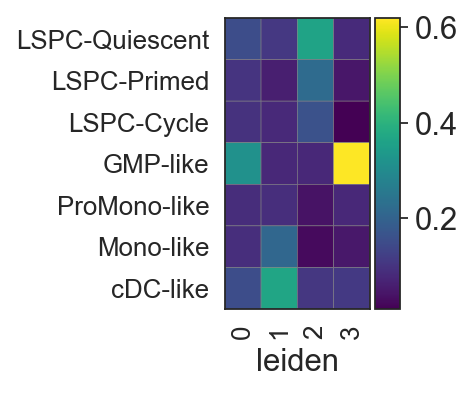

GridSpec(2, 3, height_ratios=[0, 1.4000000000000001], width_ratios=[1.2, 0, 0.2])

In [174]:
sc.pl.matrixplot(beat, var_names=celltypes, groupby='leiden', swap_axes=True, cmap='viridis')

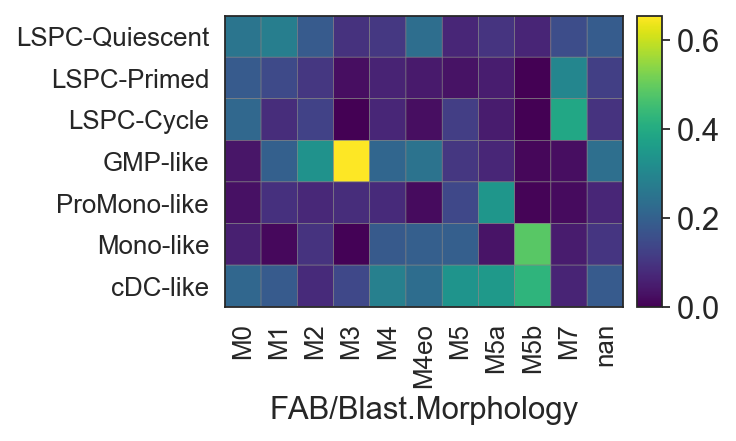

GridSpec(2, 3, height_ratios=[0, 1.4000000000000001], width_ratios=[3.3, 0, 0.2])

In [175]:
sc.pl.matrixplot(beat, var_names=celltypes, groupby='FAB/Blast.Morphology', swap_axes=True, cmap='viridis')

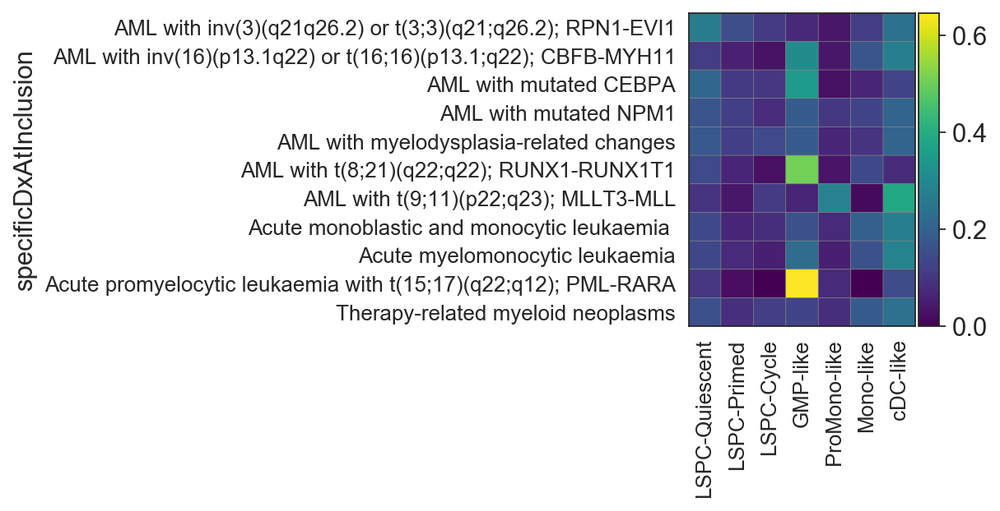

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.24, 0, 0.2])

In [176]:
exclude=['AML with maturation', 'AML with minimal differentiation', 
'AML without maturation', 'Acute erythroid leukaemia', 'Acute megakaryoblastic leukaemia', 
'Acute monoblastic and monocytic leukaemia', 'Acute myeloid leukaemia, NOS', 
'Chronic myelomonocytic leukaemia', 'Mixed phenotype acute leukaemia, T/myeloid, NOS', 
'Myeloid leukaemia associated with Down syndrome', 'Myeloid sarcoma', 'Secondary myelofibrosis', 
'Atypical chronic myeloid leukemia, BCR-ABL1 negative', 'Essential thrombocythaemia',
'Myelodysplastic syndrome, unclassifiable', 'Refractory anaemia with excess blasts']

sc.pl.matrixplot(beat[~beat.obs.specificDxAtInclusion.isin(exclude)], var_names=celltypes, groupby='specificDxAtInclusion', cmap='viridis')

## LSC17

In [179]:
obs_celltype_correlations(beat, "LSC17_Score")

,pearson,pvalue,qvalue
CellType_Enrichment,,,
LSPC-Primed-Absolute,0.429630,4.749323e-14,3.324526e-13
LSPC-Quiescent-Absolute,0.414174,4.500781e-13,1.575273e-12
GMP-like-Absolute,-0.358445,6.066292e-10,1.415468e-09
ProMono-like-Absolute,-0.290996,6.903126e-07,1.208047e-06
cDC-like-Absolute,-0.271784,3.783601e-06,5.297041e-06
LSPC-Cycle-Absolute,0.234597,7.169740e-05,8.364697e-05
Mono-like-Absolute,-0.214500,2.924609e-04,2.924609e-04


# Leucegene

In [7]:
leuc = load_Leucegene("Data/Fig2_Cohort_Deconvolution/CIBERSORTx_Results_Leucegene.csv")
leuc

AnnData object with n_obs × n_vars = 410 × 14
    obs: 'Age', 'Sex', 'Status at sampling', 'Tissue', 'Blast%', 'CD34%', 'WBC', 'WHO 2008', 'FAB', 'Karyotype', 'Normal Karyotype', 'OS (days)', 'Status at last follow-up', 'Cytogenetic risk', 'ASXL1', 'ASXL2', 'CALR', 'CBL', 'CEBPA', 'CSF3R', 'DNMT3A', 'ETV6', 'FLT3', 'FLT3-ITD', 'GATA2', 'IDH1', 'IDH2', 'JAK2', 'KIT', 'KMT2A', 'KMT2C', 'KMT2D', 'KRAS', 'MYC', 'NF1', 'NPM1', 'NRAS', 'PTPN11', 'RAD21', 'RUNX1', 'SMC1A', 'SMC3', 'SMC5', 'SPI1', 'SRSF2', 'STAG2', 'TET2', 'TP53', 'U2AF1', 'WT1', 'ZBTB7A', 'HMGA2_TPM', 'EVI1_F', 'MLL_F', 'NUP98-NSD1', 'CBF', 'APL', 'Complex', 'Cohesin', 'Glucocorticoid_Response', 'Mubritinib_GI50', 'Mubritinib_Response', 'LSCF_absolute', 'LSC category', 'UPN', 'CR1', 'Allogeneic HSCT', 'Relapse', 'Deceased', 'Survival (days)', 'HMGA2 (RT-qPCR)', 'B-Absolute', 'CTL-Absolute', 'GMP-like-Absolute', 'LSPC-Cycle-Absolute', 'LSPC-Primed-Absolute', 'LSPC-Quiescent-Absolute', 'Mono-like-Absolute', 'Monocyte-Absolute',

... storing 'Sex' as categorical
... storing 'Status at sampling' as categorical
... storing 'Tissue' as categorical
... storing 'WHO 2008' as categorical
... storing 'FAB' as categorical
... storing 'Karyotype' as categorical
... storing 'Normal Karyotype' as categorical
... storing 'Status at last follow-up' as categorical
... storing 'Cytogenetic risk' as categorical
... storing 'EVI1_F' as categorical
... storing 'MLL_F' as categorical
... storing 'NUP98-NSD1' as categorical
... storing 'CBF' as categorical
... storing 'APL' as categorical
... storing 'Complex' as categorical
... storing 'Cohesin' as categorical
... storing 'Glucocorticoid_Response' as categorical
... storing 'Mubritinib_Response' as categorical
... storing 'LSC category' as categorical
... storing 'CR1' as categorical
... storing 'Allogeneic HSCT' as categorical
... storing 'Relapse' as categorical
... storing 'Deceased' as categorical


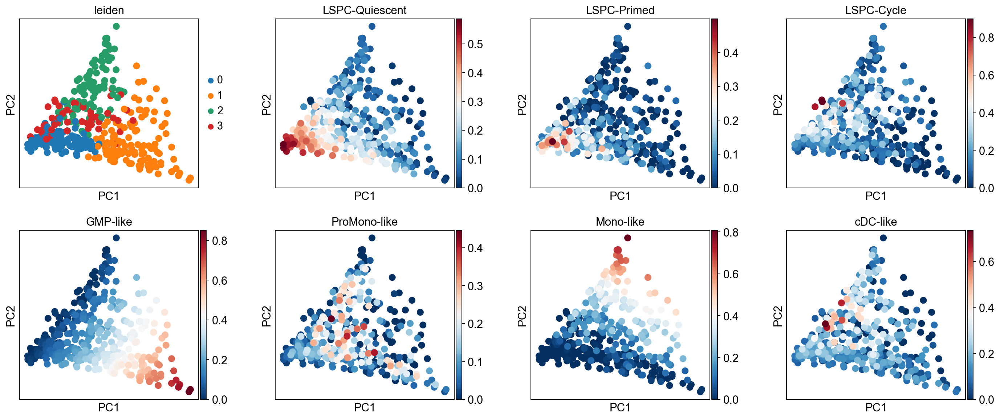

In [8]:
leuc = process_fractions(leuc, res=0.2)

In [91]:
leuc.obs[['CD34%'] + [s + '-Relative' for s in celltypes]].corr()[['CD34%']].style.background_gradient(cmap='RdBu_r')

,CD34%
CD34%,1.000000
LSPC-Quiescent-Relative,0.212599
LSPC-Primed-Relative,0.085894
LSPC-Cycle-Relative,-0.293418
GMP-like-Relative,0.373999
ProMono-like-Relative,-0.544076
Mono-like-Relative,0.046400
cDC-like-Relative,-0.356202


In [92]:
leuc.obs[['LSCF_absolute'] + [s + '-Absolute' for s in celltypes]].corr()[['LSCF_absolute']].style.background_gradient(cmap='RdBu_r')

,LSCF_absolute
LSCF_absolute,1.000000
LSPC-Quiescent-Absolute,0.444853
LSPC-Primed-Absolute,0.417953
LSPC-Cycle-Absolute,0.019480
GMP-like-Absolute,-0.160600
ProMono-like-Absolute,-0.324242
Mono-like-Absolute,-0.255783
cDC-like-Absolute,-0.154785


In [93]:
leuc.obs[['CD34%'] + [s + '-Absolute' for s in celltypes]].corr()[['CD34%']].style.background_gradient(cmap='RdBu_r')

,CD34%
CD34%,1.000000
LSPC-Quiescent-Absolute,0.228775
LSPC-Primed-Absolute,0.133365
LSPC-Cycle-Absolute,-0.371105
GMP-like-Absolute,0.353687
ProMono-like-Absolute,-0.489454
Mono-like-Absolute,0.001500
cDC-like-Absolute,-0.328624


In [94]:
leuc.obs[['Blast%'] + [s + '-Absolute' for s in celltypes]].corr()[['Blast%']].style.background_gradient(cmap='RdBu_r')

,Blast%
Blast%,1.000000
LSPC-Quiescent-Absolute,0.233442
LSPC-Primed-Absolute,0.192784
LSPC-Cycle-Absolute,-0.086804
GMP-like-Absolute,-0.267577
ProMono-like-Absolute,0.242912
Mono-like-Absolute,-0.260483
cDC-like-Absolute,0.364677


In [95]:
leuc.obs[['WBC'] + [s + '-Absolute' for s in celltypes]].corr()[['WBC']].style.background_gradient(cmap='RdBu_r')

,WBC
WBC,1.000000
LSPC-Quiescent-Absolute,0.097240
LSPC-Primed-Absolute,0.104497
LSPC-Cycle-Absolute,0.029151
GMP-like-Absolute,-0.027911
ProMono-like-Absolute,0.063855
Mono-like-Absolute,-0.018246
cDC-like-Absolute,0.122232


/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2492: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


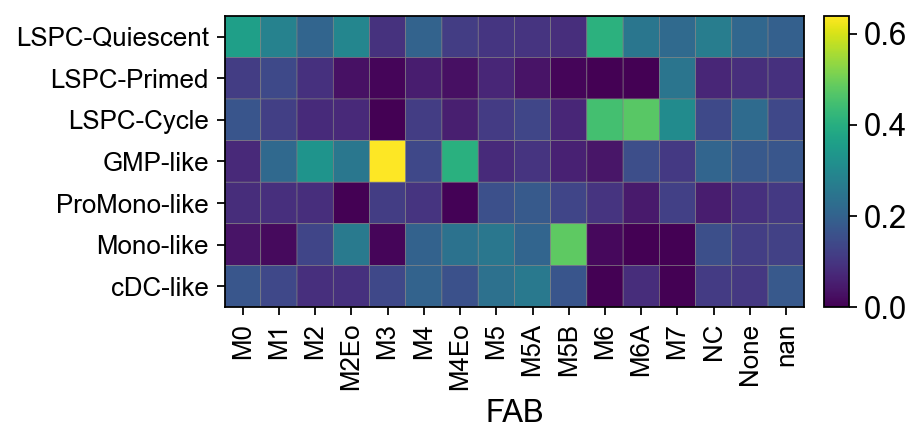

GridSpec(2, 3, height_ratios=[0, 1.4000000000000001], width_ratios=[4.8, 0, 0.2])

In [10]:
sc.pl.matrixplot(leuc, var_names=celltypes, groupby='FAB', swap_axes=True, cmap='viridis')

# Combined

In [1449]:
dir = "Data/Fig2_Cohort_Deconvolution/"

tcga_raw = load_TCGA(dir+"CIBERSORTx_Results_TCGA.csv")
beat_raw = load_BEAT(dir+"CIBERSORTx_Results_BEAT.csv", diagnosis_only = True)
leuc_raw = load_Leucegene(dir+"CIBERSORTx_Results_Leucegene.csv")

Trying to set attribute `.obs` of view, copying.


In [1450]:
cat = ad.AnnData.concatenate(tcga_raw, beat_raw, leuc_raw, batch_key = 'Cohort', batch_categories = ['TCGA', 'BEAT', 'Leucegene'], index_unique=None)
cat

AnnData object with n_obs × n_vars = 864 × 14
    obs: 'patient_id', 'vital_status', 'days_to_death', 'days_to_last_followup', 'patient.molecular_analysis_abnormality_testing_results.molecular_analysis_abnormality_testing_result_values.molecular_analysis_abnormality_testing_result', 'acute_myeloid_leukemia_calgb_cytogenetics_risk_category', 'leukemia_french_american_british_morphology_code', 'age_at_initial_pathologic_diagnosis', 'atra_exposure', 'cytogenetic_abnormality', 'cytogenetic_abnormality-2', 'cytogenetic_abnormality-3', 'cytogenetic_abnormality-4', 'cytogenetic_abnormality_other', 'days_to_birth', 'days_to_initial_pathologic_diagnosis', 'gender', 'history_of_neoadjuvant_treatment', 'hydroxyurea_administration_prior_registration_clinical_study_indicator', 'hydroxyurea_agent_administered_day_count', 'lab_procedure_abnormal_lymphocyte_result_percent_value', 'lab_procedure_blast_cell_outcome_percentage_value', 'lab_procedure_bone_marrow_band_cell_result_percent_value', 'lab_proce

In [1451]:
celltypes = ['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like']#, 'B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry']

def process_fractions_new(adata, res=0.5, cohort = 'TCGA'):
    
    adata = adata[:,~adata.var_names.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte'])]
    adata.X = (adata.X.transpose() / adata.X.sum(axis=1)).transpose()

    sc.pp.pca(adata)#, n_comps=4)
    sc.pp.neighbors(adata, n_neighbors=30)
    sc.tl.umap(adata, min_dist=0.1)
    
    # for hierarchy cohorts - flip PC2
    adata.obsm['X_pca'][:,1] = -adata.obsm['X_pca'][:,1]
    sc.pl.pca(adata, color=celltypes, color_map = 'RdBu_r', wspace = 0.3, ncols=4)
    
    return(adata)

In [1453]:
%%capture 
cat = process_fractions_new(cat)

... storing 'patient_id' as categorical
... storing 'vital_status' as categorical
... storing 'days_to_death' as categorical
... storing 'days_to_last_followup' as categorical
... storing 'patient.molecular_analysis_abnormality_testing_results.molecular_analysis_abnormality_testing_result_values.molecular_analysis_abnormality_testing_result' as categorical
... storing 'acute_myeloid_leukemia_calgb_cytogenetics_risk_category' as categorical
... storing 'leukemia_french_american_british_morphology_code' as categorical
... storing 'age_at_initial_pathologic_diagnosis' as categorical
... storing 'atra_exposure' as categorical
... storing 'cytogenetic_abnormality' as categorical
... storing 'cytogenetic_abnormality-2' as categorical
... storing 'cytogenetic_abnormality-3' as categorical
... storing 'cytogenetic_abnormality-4' as categorical
... storing 'cytogenetic_abnormality_other' as categorical
... storing 'days_to_birth' as categorical
... storing 'days_to_initial_pathologic_diagnosis'

#### Quick check on the optimal number of clusters

In [1454]:
catdat = cat.to_df()

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 7 proposed 2 as the best number of clusters 
* 2 proposed 3 as the best number of clusters 
* 11 proposed 4 as the best number of clusters 
* 1 proposed 7 as the best number of clusters 
* 2 proposed 9 as the best number

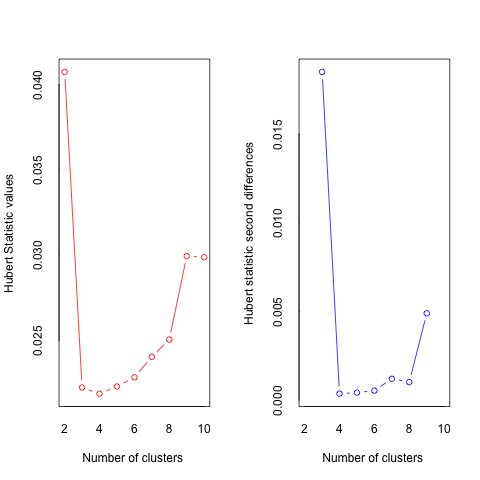

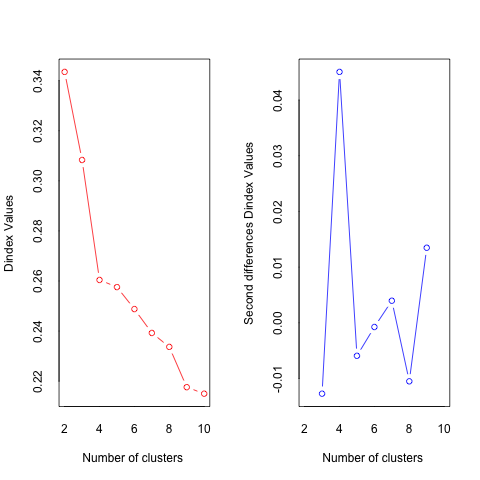

In [1455]:
%%R -i catdat

library(NbClust)
NbClust(data = catdat, distance = "euclidean",
        min.nc = 2, max.nc = 10, method = 'average')

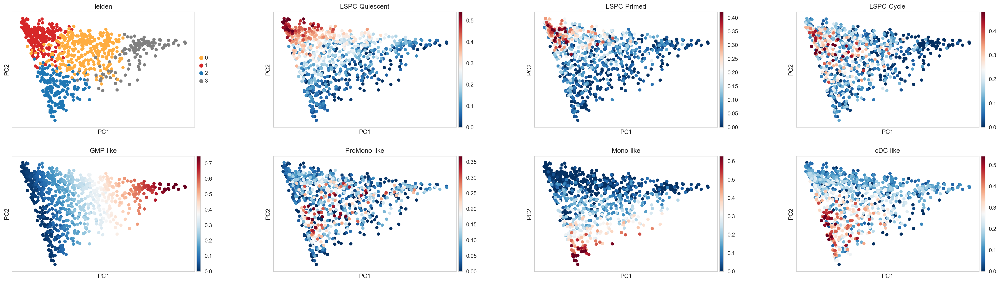

In [1456]:
# ensure 4 clusters 
sc.tl.leiden(cat, resolution = 0.4)
sc.pl.pca(cat, color=['leiden']+celltypes, color_map = 'RdBu_r', palette=['#FFAD41', '#d62728', '#1f77b4', '#808080'], wspace = 0.3, ncols=4, vmin='p1', vmax='p99')

In [1458]:
cat.obs['Cluster'] = np.where(cat.obs['leiden'] == '1', 'Primitive',
                               np.where(cat.obs['leiden'] == '2', 'Mature',
                                        np.where(cat.obs['leiden'] == '3', 'GMP', 'Intermediate')))

... storing 'Cluster' as categorical


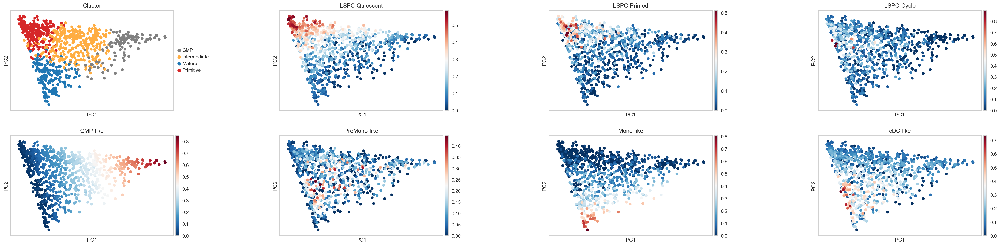

In [1459]:
sc.pl.pca(cat, color=['Cluster'] + celltypes, cmap='RdBu_r', palette=['#808080', '#FFAD41', '#1f77b4', '#d62728'], wspace=0.5)

## Visualize composition in each patient

In [1466]:
cat.obs['PC1'] = cat.obsm['X_pca'][:,0]
cat.obs['PC2'] = cat.obsm['X_pca'][:,1]
cat.obs['PC3'] = cat.obsm['X_pca'][:,2]
cat.obs['PC4'] = cat.obsm['X_pca'][:,3]
cat.obs['PC5'] = cat.obsm['X_pca'][:,4]
cat.obs['PC6'] = cat.obsm['X_pca'][:,5]

In [1467]:
cat_obs = cat.obs[['Cluster', 'PC2']].join(cat.to_df()).reset_index()

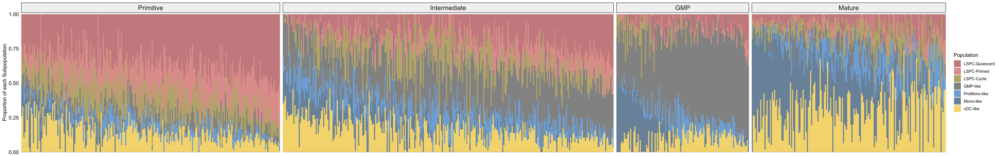

In [1469]:
%%R -i cat_obs -w 32 -h 5 --units in -r 320

hierarchy_colors = c('#A7303099', '#CD534C99', '#8F770099', '#3B3B3B99', '#0073C299', '#003C6799', '#EFC00099')

populations = cat_obs %>% 
    select(index, PC2, Cluster, 'LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 
           'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like') %>% 
    mutate(index = factor(index, levels = arrange(., PC2)$index)) %>%
    select(-PC2) %>%
    # back to business
    gather(-index, -Cluster, key = "Population", value = "prop") %>%
    mutate(Cluster = factor(Cluster, levels = c('Primitive', 'Intermediate', 'GMP', 'Mature')),
           Population = factor(Population, levels = c("LSPC-Quiescent", "LSPC-Primed", "LSPC-Cycle", 
                                                    "GMP-like", "ProMono-like", "Mono-like", "cDC-like")))
    
cluster_bars <- populations %>% 
    ggplot(aes(x=index, y=prop, fill=Population, width=1)) +
        geom_col() + 
        scale_fill_manual(values = hierarchy_colors) + 
        ylab("Proportion of each Subpopulation") + 
        theme_pubr() +
        scale_y_continuous(expand = c(0, 0), limits = c(0, 1.01)) +
        facet_grid(.~Cluster, scales="free_x", space = "free_x") + 
        theme(legend.position = "right", 
            axis.title.x = element_blank(),
            axis.text.x = element_blank(),
            axis.ticks = element_blank(),
            strip.text.x = element_text(size = 15), 
            axis.line.x = element_line(colour = 'black', size = 0.1),
            axis.line.y = element_blank())
        
cluster_bars# + ggsave("Figures/cat_bars_Clusters.png", height = 6, width = 24, dpi = 'retina')

### Bring in Genomic Data

In [1470]:
hcat_genomics = pd.read_csv("../../../../Paper_Analysis/Hierarchy_3Cohort_Clusters.csv").set_index('Unnamed: 0')
genomics = pd.read_csv('../../../../Paper_Analysis/Mutations/Cohort_Combined_Cytogenetics_Mutations_Feb16.csv').set_index('Patient')
hcat_genomics = hcat_genomics.join(genomics[['TP53_mut']])
hcat_genomics['GenomicGroup'] = np.where((hcat_genomics['GenomicGroup'] == 'Complex') * (hcat_genomics['TP53_mut'] == 'Positive'), 'Complex + TP53', hcat_genomics['GenomicGroup'])
cat.obs = cat.obs.join(hcat_genomics[['GenomicGroup']])
cat.obs['GenomicGroup'].value_counts()

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/computation/expressions.py:205: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  f"evaluating in Python space because the {repr(op_str)} "


Complex + TP53           63
Complex                  53
NPM1                     52
NPM1 + FLT3-ITD          51
inv(16)                  49
t(15;17)                 45
Chromatin-Spliceosome    42
t(8;21)                  32
MLL-Other                28
NPM1 + FLT3-TKD          15
MLL-AF9                  14
inv(3)                   14
NPM1 + RAS               14
Name: GenomicGroup, dtype: int64

In [60]:
def get_obs_prop(adata, obs1, obs2, prop=False):
    if prop == True:
        return(adata.obs.groupby(obs1)[obs2].value_counts(normalize=True).mul(100).unstack().fillna(0).round(1)).T
    else:
        return(adata.obs.groupby(obs1)[obs2].value_counts().unstack().fillna(0).round(1)).T

Signature: tk.get_obs_prop(adata, obs1, obs2, prop=False)
Docstring: <no docstring>
Source:   
def get_obs_prop(adata, obs1, obs2, prop=False):
    if prop == True:
        return(adata.obs.groupby(obs1)[obs2].value_counts(normalize=True).mul(100).unstack().fillna(0).round(1)).T
    else:
        return(adata.obs.groupby(obs1)[obs2].value_counts().unstack().fillna(0).round(1)).T
File:      ~/Drive/Laptop/Dick_Lab/scRNA_HSC/scRNA_toolkit.py
Type:      function


In [1471]:
get_obs_prop(cat, 'GenomicGroup', 'leiden', prop=True).style.background_gradient(cmap='viridis')

GenomicGroup,Chromatin-Spliceosome,Complex,Complex + TP53,MLL-AF9,MLL-Other,NPM1,NPM1 + FLT3-ITD,NPM1 + FLT3-TKD,NPM1 + RAS,inv(16),inv(3),t(15;17),t(8;21)
leiden,,,,,,,,,,,,,
0,38.100000,24.500000,41.300000,14.300000,35.700000,42.300000,35.300000,46.700000,7.100000,61.200000,14.300000,4.400000,28.100000
1,45.200000,50.900000,38.100000,7.100000,14.300000,23.100000,43.100000,0.000000,14.300000,4.100000,64.300000,0.000000,0.000000
2,11.900000,17.000000,12.700000,78.600000,50.000000,30.800000,17.600000,53.300000,78.600000,18.400000,7.100000,0.000000,3.100000
3,4.800000,7.500000,7.900000,0.000000,0.000000,3.800000,3.900000,0.000000,0.000000,16.300000,14.300000,95.600000,68.800000


In [1472]:
pd.DataFrame(cat.varm['PCs'], columns= ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'], index=cat.var.index).\
    loc[['LSPC-Quiescent', 'LSPC-Primed', 'LSPC-Cycle', 'GMP-like', 'ProMono-like', 'Mono-like', 'cDC-like']]\
    .style.background_gradient(cmap='RdBu_r')

,PC1,PC2,PC3,PC4,PC5,PC6
LSPC-Quiescent,-0.322275,-0.512637,-0.166757,-0.436194,-0.407044,-0.326691
LSPC-Primed,-0.194361,-0.279069,-0.012969,-0.195990,0.693376,0.471313
LSPC-Cycle,-0.221707,-0.087728,0.643727,0.468562,-0.325798,0.245383
GMP-like,0.890134,-0.200233,0.007245,-0.058109,-0.114686,0.090167
ProMono-like,0.002765,0.045271,-0.054780,0.434588,0.412200,-0.702360
Mono-like,-0.027682,0.710197,0.275432,-0.516840,-0.004437,-0.094820
cDC-like,-0.126874,0.324199,-0.691898,0.303982,-0.253611,0.317008


## NMF

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1091: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  " improve convergence." % max_iter, ConvergenceWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: Fut

[0.8933400489665844, 0.6222685094646834, 0.37223964067244975, 0.24882577925368587, 0.13377681960938148, 0.06820999189383459, 1.315579369887132e-07, 1.1879536843117933e-07, 4.5338162668606685e-07, 4.3420328033061395e-07, 6.109476089477539e-07, 4.942908331528884e-07, 5.613460585252028e-07, 8.077671130868325e-07]


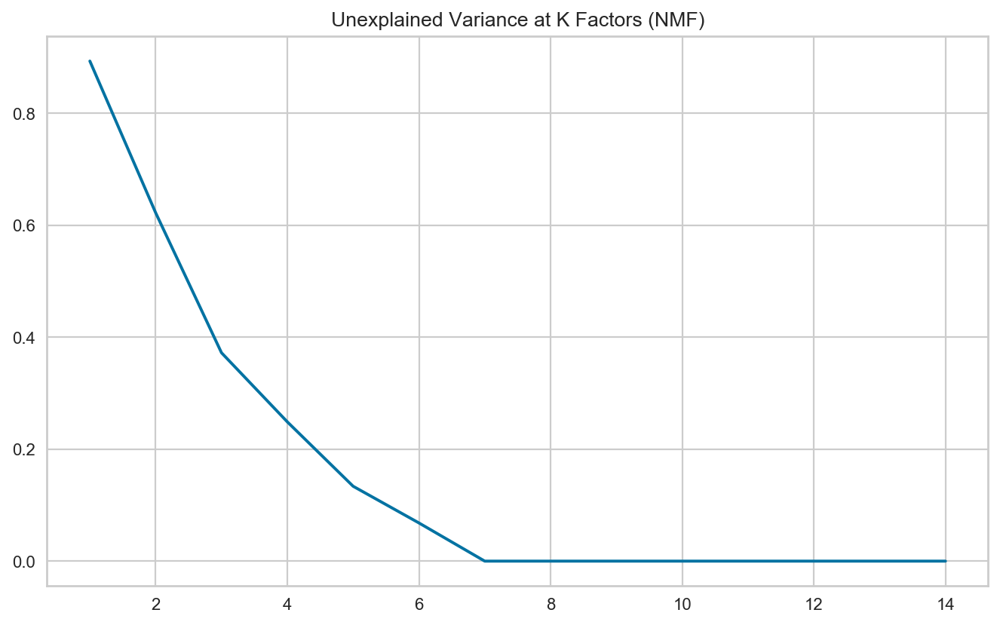

<Figure size 480x320 with 0 Axes>

In [1473]:
ncomponents_NMF(cat)

In [1474]:
cat = do_NMF(cat, 3)
cat.var.loc[celltypes, ['NMF1', 'NMF2', 'NMF3']].style.background_gradient(cmap='RdBu_r')

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:315: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  "'nndsvda' in 1.1 (renaming of 0.26)."), FutureWarning)


,NMF1,NMF2,NMF3
LSPC-Quiescent,2.026507,0.106172,0.000000
LSPC-Primed,1.089554,0.000000,0.000000
LSPC-Cycle,1.011999,0.000000,0.416126
GMP-like,0.000000,3.388606,0.000000
ProMono-like,0.366278,0.357300,0.489899
Mono-like,0.000000,0.000000,2.185151
cDC-like,0.713703,0.195396,1.718795


... storing 'GenomicGroup' as categorical


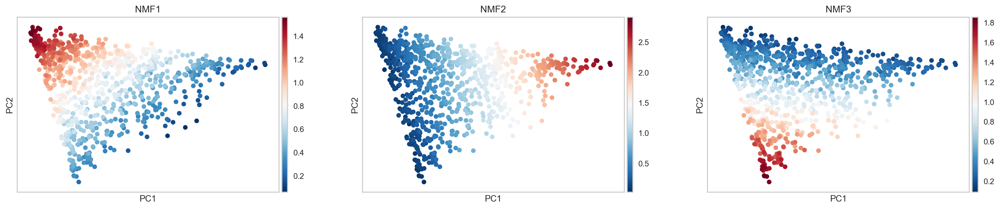

In [1475]:
sc.pl.pca(cat, color=['NMF1', 'NMF2', 'NMF3'], color_map = 'RdBu_r', wspace = 0.2, ncols=3)

### TCGA survival

In [1476]:
tcga_obs = cat[cat.obs.Cohort == "TCGA"].obs

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2492: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


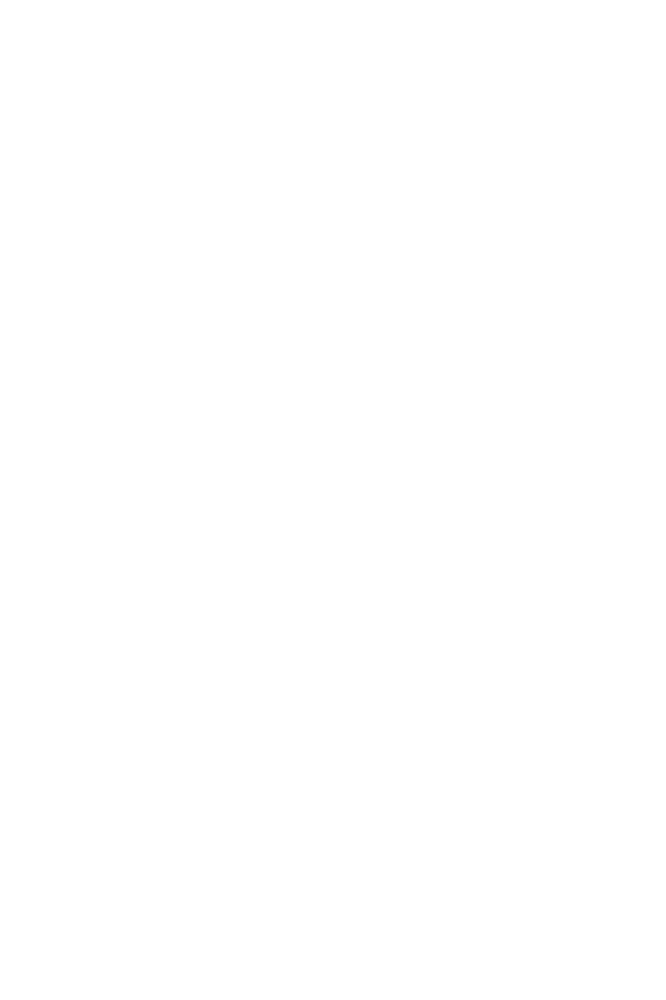

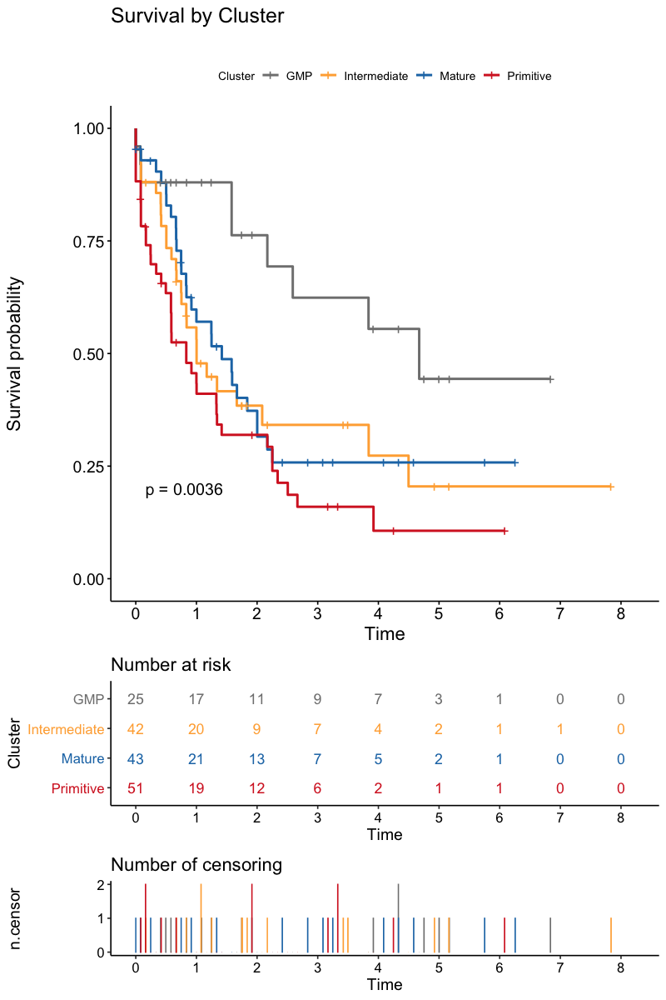

In [1477]:
%%R -i tcga_obs -w 8 -h 12 --units in -r 100

# convert factors to chr
indx <- sapply(tcga_obs, is.factor)
tcga_obs[indx] <- lapply(tcga_obs[indx], function(x) as.character(x))
# set time and status
tcga_obs <- tcga_obs %>% 
    mutate(time = if_else(vital_status == "dead", days_to_death, days_to_last_followup) %>% as.numeric(), 
          status = if_else(vital_status == "dead", 1, 0))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, legend.labs = labels, 
               pval = TRUE, palette = c('#808080', '#FFAD41', '#1f77b4', '#d62728'),
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}#ff7f0e

# Fit survival curves
survfit(Surv(time, status) ~ Cluster, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "Cluster", c('GMP', 'Intermediate', 'Mature', 'Primitive'))

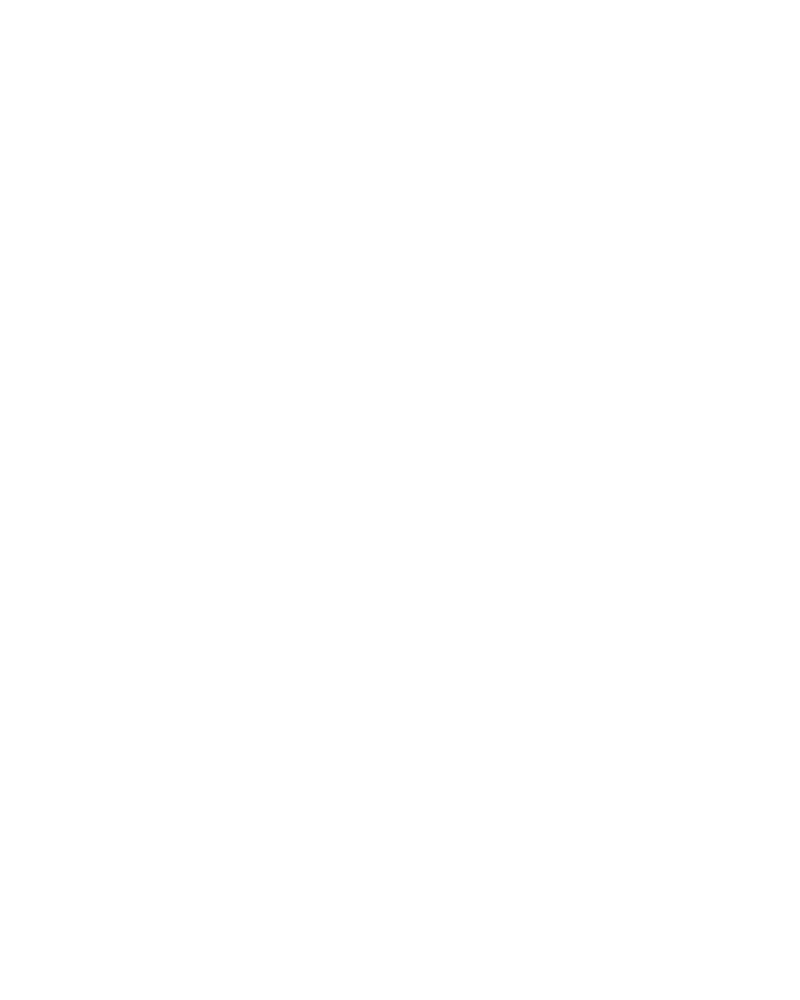

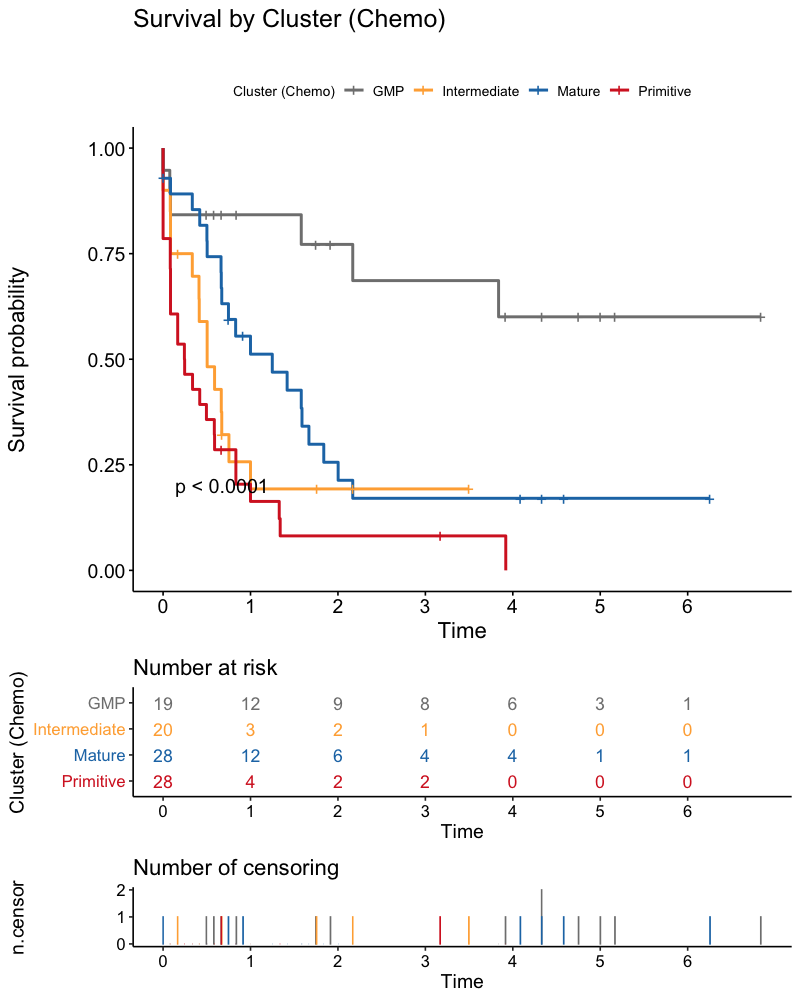

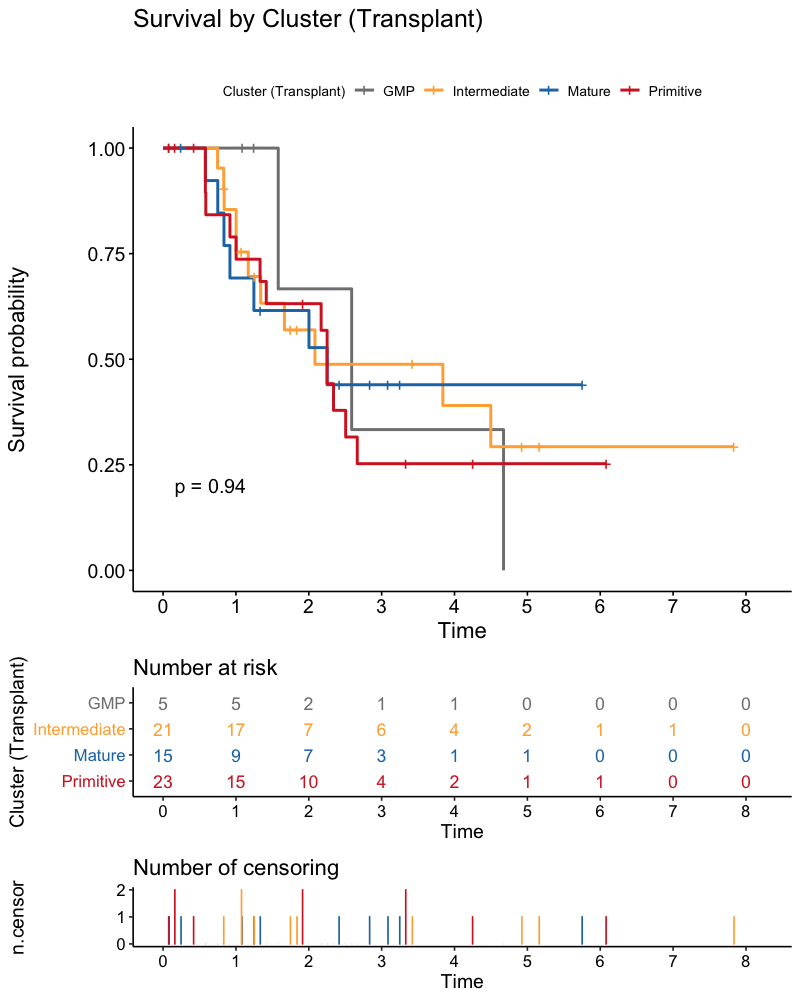

In [1478]:
%%R -w 8 -h 10 --units in -r 100

tcga_obs <- tcga_obs %>% mutate(Transplant = if_else(`Transplant Type` == 'nan', "NA", 
                                                    if_else(`Transplant Type` == 0, "Chemo Only", 'Transplant')))

survfit(Surv(time, status) ~ Cluster, data = tcga_obs %>% filter(Transplant == 'Chemo Only'), type = 'kaplan-meier') %>% get_survplot(., "Cluster (Chemo)", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
survfit(Surv(time, status) ~ Cluster, data = tcga_obs %>% filter(Transplant == 'Transplant'), type = 'kaplan-meier') %>% get_survplot(., "Cluster (Transplant)", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
#survfit(Surv(time, status) ~ Cluster, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "Cluster", c('GMP', 'Intermediate', 'Mature', 'Primitive'))


In [1479]:
%%R 

res.cox <- coxph(Surv(time, status) ~  `LSPC-Quiescent-Absolute` + `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + 
                 `GMP-like-Absolute` + `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute`
                ,data = tcga_obs)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ `LSPC-Quiescent-Absolute` + 
    `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + `GMP-like-Absolute` + 
    `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute`, 
    data = tcga_obs)

  n= 161, number of events= 103 
   (12 observations deleted due to missingness)

                              coef exp(coef) se(coef)      z Pr(>|z|)   
`LSPC-Quiescent-Absolute`  0.46798   1.59676  0.20180  2.319  0.02039 * 
`LSPC-Primed-Absolute`    -0.12141   0.88567  0.25223 -0.481  0.63028   
`LSPC-Cycle-Absolute`      0.11316   1.11982  0.21808  0.519  0.60383   
`GMP-like-Absolute`       -0.35971   0.69788  0.11677 -3.080  0.00207 **
`ProMono-like-Absolute`    0.02638   1.02673  0.18107  0.146  0.88418   
`Mono-like-Absolute`      -0.13961   0.86970  0.10786 -1.294  0.19553   
`cDC-like-Absolute`        0.32956   1.39036  0.15433  2.135  0.03272 * 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

                     

In [1480]:
%%R 

res.cox <- coxph(Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + PC5 
                ,data = tcga_obs)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + 
    PC5, data = tcga_obs)

  n= 161, number of events= 103 
   (12 observations deleted due to missingness)

        coef exp(coef) se(coef)      z Pr(>|z|)    
PC1 -2.48778   0.08309  0.52602 -4.729 2.25e-06 ***
PC2  0.24430   1.27672  0.50391  0.485   0.6278    
PC3 -1.40395   0.24562  0.74505 -1.884   0.0595 .  
PC4  0.65613   1.92732  0.94045  0.698   0.4854    
PC5 -1.76880   0.17054  1.01127 -1.749   0.0803 .  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

    exp(coef) exp(-coef) lower .95 upper .95
PC1   0.08309    12.0346   0.02964     0.233
PC2   1.27672     0.7833   0.47552     3.428
PC3   0.24562     4.0713   0.05703     1.058
PC4   1.92732     0.5189   0.30510    12.175
PC5   0.17054     5.8638   0.02350     1.238

Concordance= 0.662  (se = 0.029 )
Likelihood ratio test= 31.08  on 5 df,   p=9e-06
Wald test            = 28.16  on 5 df,   p=3e-05
Score (logrank) test = 30.06  on 5 df,  

### BEAT Survival

In [1481]:
beat_obs = cat[cat.obs.Cohort == "BEAT"].obs

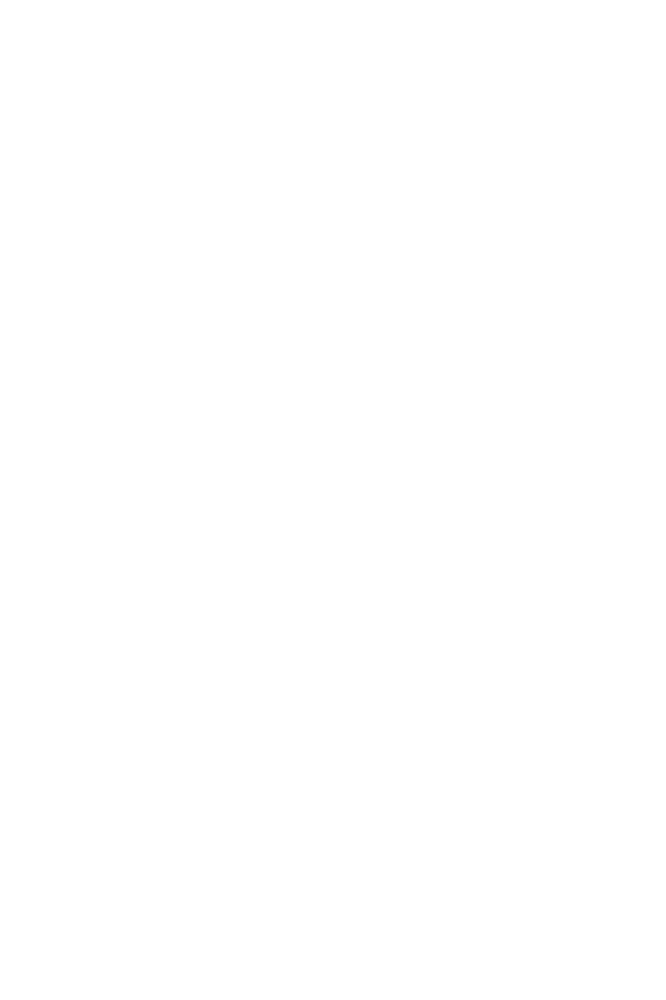

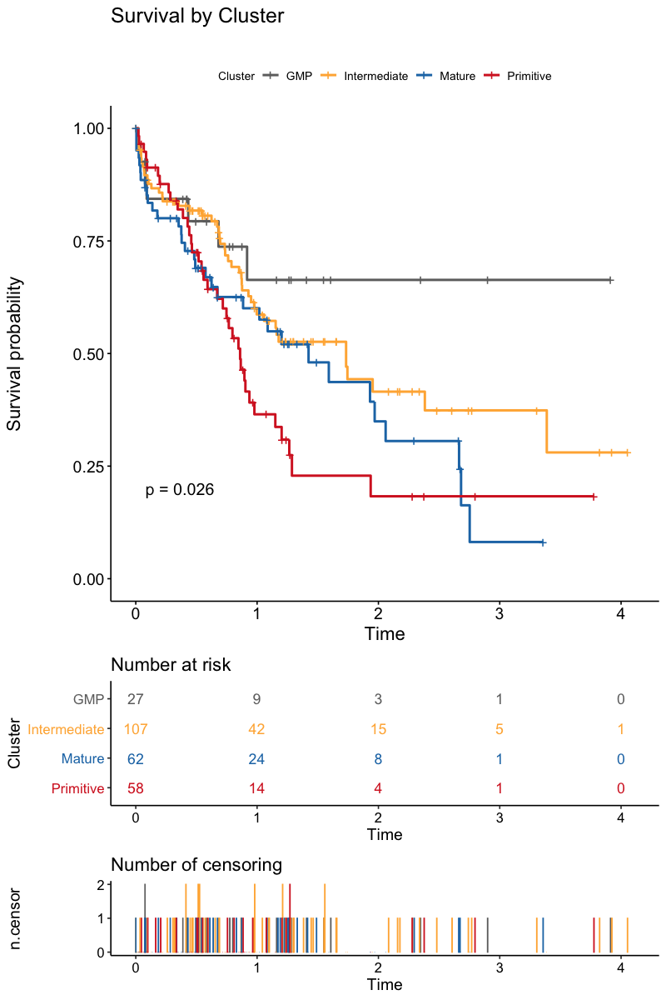

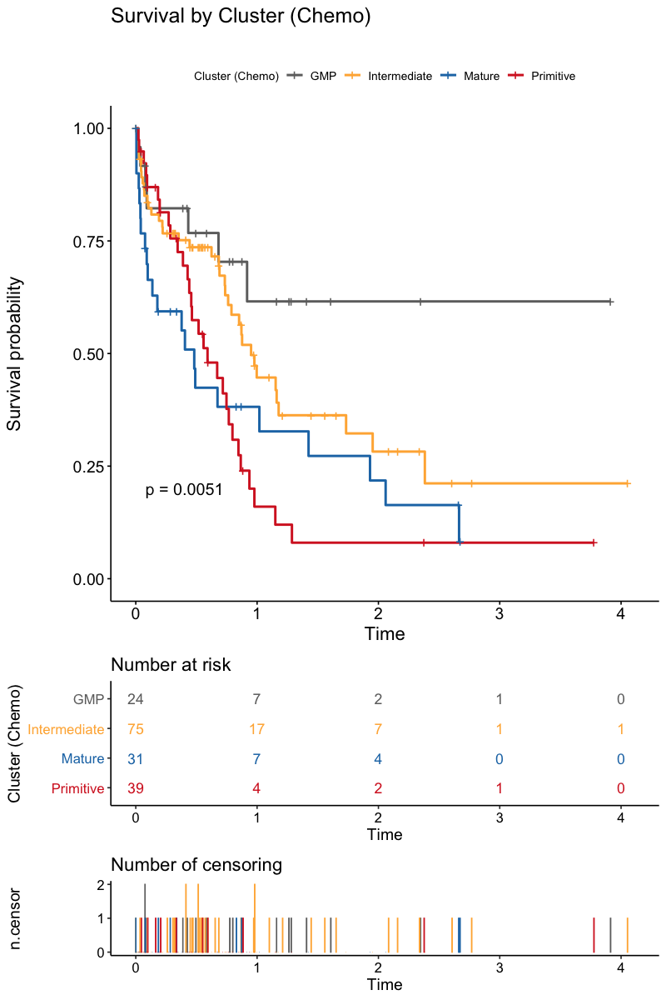

In [1482]:
%%R -i beat_obs -w 8 -h 12 --units in -r 100

# convert factors to chr
indx <- sapply(beat_obs, is.factor)
beat_obs[indx] <- lapply(beat_obs[indx], function(x) as.character(x))
# set time and status
beat <- beat_obs %>% 
    mutate(time = overallSurvival %>% as.numeric(), 
          status = if_else(vitalStatus == "Dead", 1, 0))
    
    
get_survplot <- function(fit, cat_name, labels){
    # Drawing curves
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.15,
               legend.title = cat_name, legend.labs = labels, 
               #palette = 'jco', pval = TRUE, 
               palette = c('#6E6E6E', '#ffb241', '#1f77b4', '#d62728'), pval = TRUE, 
               #conf.int = TRUE, conf.int.style = "step", 
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
#     ggsave(paste0("Figures/BEAT-AML_Survival_by_", cat_name, ".png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)

}

survfit(Surv(time, status) ~ Cluster, data = beat, type = 'kaplan-meier') %>% get_survplot(., "Cluster", c("GMP", "Intermediate", "Mature", "Primitive"))

beat <- beat %>% mutate(Therapy = if_else(cumulativeTreatmentTypes %>% str_detect('Transplant'), 'Transplant', 
                                      if_else(cumulativeTreatmentTypes %>% str_detect('Target'), 'Targeted', 'Chemotherapy')))
survfit(Surv(time, status) ~ Cluster, data = beat %>% filter(Therapy != 'Transplant'), type = 'kaplan-meier') %>% get_survplot(., "Cluster (Chemo)", c("GMP", "Intermediate", "Mature", "Primitive"))


In [1483]:
%%R 

res.cox <- coxph(Surv(time, status) ~  `LSPC-Quiescent-Absolute` + `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + 
                 `GMP-like-Absolute` + `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute` 
                ,data = beat)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ `LSPC-Quiescent-Absolute` + 
    `LSPC-Primed-Absolute` + `LSPC-Cycle-Absolute` + `GMP-like-Absolute` + 
    `ProMono-like-Absolute` + `Mono-like-Absolute` + `cDC-like-Absolute`, 
    data = beat)

  n= 254, number of events= 123 
   (27 observations deleted due to missingness)

                              coef exp(coef) se(coef)      z Pr(>|z|)  
`LSPC-Quiescent-Absolute` -0.01207   0.98800  0.19306 -0.063   0.9501  
`LSPC-Primed-Absolute`     0.55778   1.74679  0.36719  1.519   0.1288  
`LSPC-Cycle-Absolute`      0.47675   1.61083  0.19877  2.398   0.0165 *
`GMP-like-Absolute`       -0.28297   0.75354  0.12409 -2.280   0.0226 *
`ProMono-like-Absolute`    0.03810   1.03884  0.21646  0.176   0.8603  
`Mono-like-Absolute`       0.32135   1.37899  0.13439  2.391   0.0168 *
`cDC-like-Absolute`       -0.16540   0.84755  0.17239 -0.959   0.3373  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

                          exp(coe

In [1484]:
%%R 

res.cox <- coxph(Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + PC5 
                ,data = beat)
summary(res.cox)

Call:
coxph(formula = Surv(time, status) ~ PC1 + PC2 + PC3 + PC4 + 
    PC5, data = beat)

  n= 254, number of events= 123 
   (27 observations deleted due to missingness)

       coef exp(coef) se(coef)      z Pr(>|z|)    
PC1 -2.1094    0.1213   0.5477 -3.851 0.000117 ***
PC2 -0.7131    0.4901   0.5189 -1.374 0.169404    
PC3  2.7892   16.2685   0.7359  3.790 0.000150 ***
PC4 -0.5629    0.5696   0.7683 -0.733 0.463792    
PC5  1.1962    3.3074   1.1123  1.075 0.282178    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

    exp(coef) exp(-coef) lower .95 upper .95
PC1    0.1213    8.24307   0.04147    0.3549
PC2    0.4901    2.04028   0.17725    1.3553
PC3   16.2685    0.06147   3.84571   68.8209
PC4    0.5696    1.75568   0.12635    2.5675
PC5    3.3074    0.30235   0.37388   29.2574

Concordance= 0.615  (se = 0.028 )
Likelihood ratio test= 28.88  on 5 df,   p=2e-05
Wald test            = 28.12  on 5 df,   p=3e-05
Score (logrank) test = 28.7  on 5 df,   p=3e-05



## PC Correlation with LSC17

In [1485]:
def obs_dimred_correlations(adata, obs, method = 'pearson'):
    
    score = adata.obs[obs].values
    correlations = pd.DataFrame(columns=[method, 'pvalue'])

    for celltype in ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'NMF1', 'NMF2', 'NMF3', 
                    'LSPC-Quiescent-Absolute', 'LSPC-Primed-Absolute', 'LSPC-Cycle-Absolute', 'GMP-like-Absolute', 'ProMono-like-Absolute', 'Mono-like-Absolute', 'cDC-like-Absolute']:
        cellprop = adata.obs[celltype].values
        if method == 'pearson':
            data = pd.DataFrame(np.asarray(scipy.stats.pearsonr(score, cellprop)), index=[method, 'pvalue'], columns=[celltype]).T
        elif method == 'spearman':
            data = pd.DataFrame(np.asarray(scipy.stats.spearmanr(score, cellprop)), index=[method, 'pvalue'], columns=[celltype]).T

        correlations = correlations.append(data)

    correlations['qvalue'] = multitest.multipletests(correlations.pvalue, alpha=0.05, method='fdr_bh', is_sorted=False, returnsorted=False)[1]
    correlations.index.name = "CellType_Enrichment"

    return(correlations.sort_values('qvalue'))


In [1486]:
obs_dimred_correlations(cat[cat.obs['Cohort'] == "TCGA"], "LSC17_Score")

,pearson,pvalue,qvalue
CellType_Enrichment,,,
LSPC-Quiescent-Absolute,0.611329,4.149066e-19,6.638506e-18
NMF1,0.506988,1.097860e-12,8.782878e-12
PC1,-0.390517,1.086332e-07,5.793769e-07
NMF2,-0.328824,1.000294e-05,4.001175e-05
PC4,-0.306469,4.116153e-05,1.097641e-04
GMP-like-Absolute,-0.309440,3.432710e-05,1.097641e-04
LSPC-Primed-Absolute,0.258118,6.065078e-04,1.386304e-03
PC2,0.192606,1.112392e-02,2.224785e-02
ProMono-like-Absolute,-0.185664,1.445988e-02,2.570645e-02


In [1487]:
obs_dimred_correlations(cat[cat.obs['Cohort'] == "BEAT"], "LSC17_Score")

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2492: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


,pearson,pvalue,qvalue
CellType_Enrichment,,,
NMF1,0.537352,2.005156e-22,3.208250e-21
LSPC-Primed-Absolute,0.429630,4.749323e-14,3.799459e-13
PC1,-0.415248,3.863570e-13,1.800312e-12
LSPC-Quiescent-Absolute,0.414174,4.500781e-13,1.800312e-12
GMP-like-Absolute,-0.358445,6.066292e-10,1.941214e-09
NMF2,-0.342674,3.675163e-09,9.800435e-09
PC2,0.317674,5.236479e-08,1.196909e-07
ProMono-like-Absolute,-0.290996,6.903126e-07,1.380625e-06
cDC-like-Absolute,-0.271784,3.783601e-06,6.726402e-06


## Split patients on PCs and NMF scores


In [1488]:
cat.obs['PC1_median'] = np.where(cat.obs['PC1'] > cat.obs['PC1'].median(), "High", "Low")
breaks = jenkspy.jenks_breaks(cat.obs['PC1'], nb_class=2)

In [1489]:
cat.obs['PC2_median'] = np.where(cat.obs['PC2'] > cat.obs['PC2'].median(), "High", "Low")
breaks = jenkspy.jenks_breaks(cat.obs['PC2'], nb_class=2)

In [1490]:
cat.obs['NMF1_median'] = np.where(cat.obs['NMF1'] > cat.obs['NMF1'].median(), "High", "Low")
cat.obs['NMF2_median'] = np.where(cat.obs['NMF2'] > cat.obs['NMF2'].median(), "High", "Low")
cat.obs['NMF3_median'] = np.where(cat.obs['NMF3'] > cat.obs['NMF3'].median(), "High", "Low")

In [1491]:
tcga_obs = cat[cat.obs['Cohort'] == 'TCGA'].obs

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2492: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


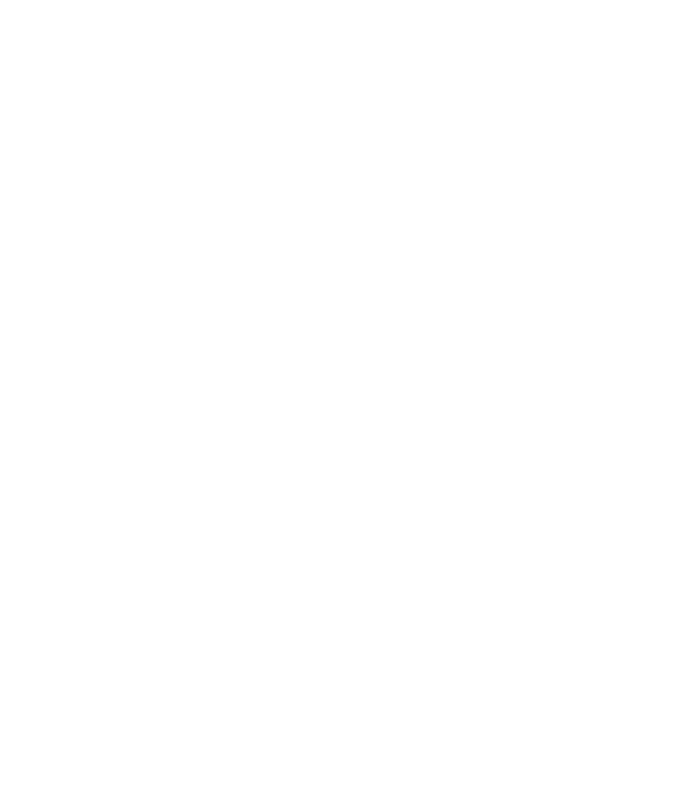

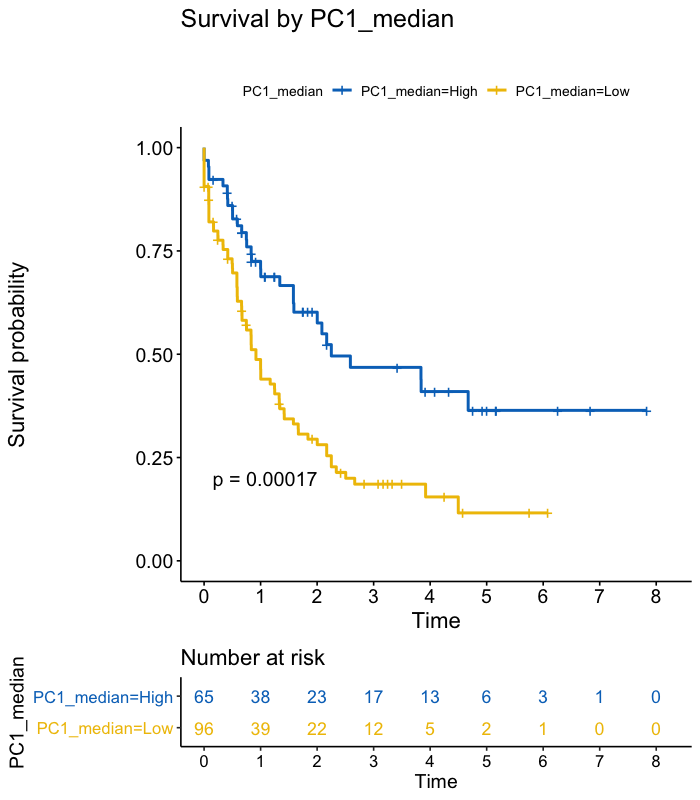

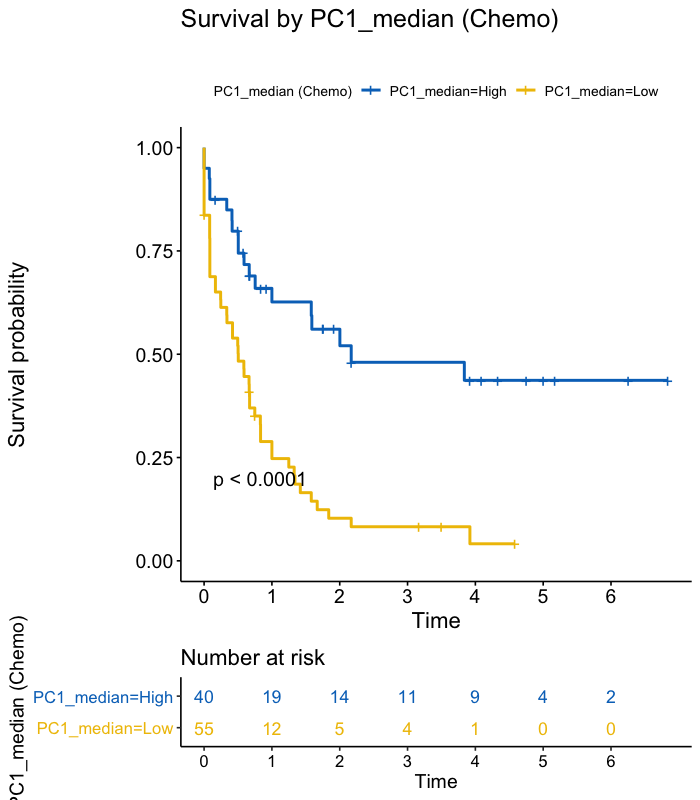

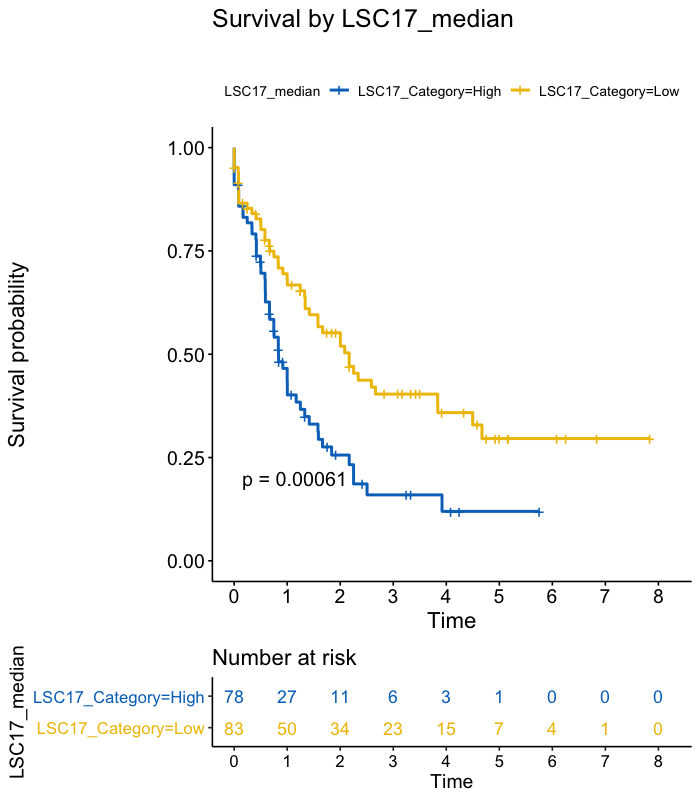

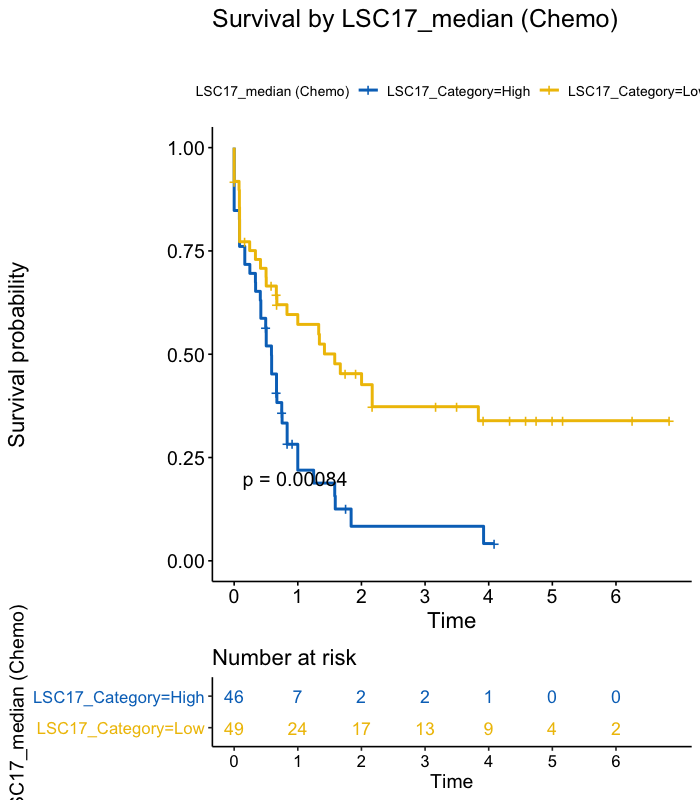

In [1492]:
%%R -i tcga_obs -w 7 -h 8 --units in -r 100

# convert factors to chr
indx <- sapply(tcga_obs, is.factor)
tcga_obs[indx] <- lapply(tcga_obs[indx], function(x) as.character(x))
# set time and status
tcga_obs <- tcga_obs %>% 
    mutate(time = if_else(vital_status == "dead", days_to_death, days_to_last_followup) %>% as.numeric(), 
          status = if_else(vital_status == "dead", 1, 0))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("Survival by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, # legend.labs = labels, 
               palette = 'jco', pval = TRUE, 
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = FALSE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}

tcga_obs <- tcga_obs %>% mutate(Transplant = if_else(`Transplant Type` == 'nan', "NA", 
                                                    if_else(`Transplant Type` == 0, "Chemo Only", 'Transplant')))

## Fit survival curves
survfit(Surv(time, status) ~ PC1_median, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "PC1_median")
survfit(Surv(time, status) ~ PC1_median, data = tcga_obs %>% filter(Transplant == 'Chemo Only'), type = 'kaplan-meier') %>% get_survplot(., "PC1_median (Chemo)")

survfit(Surv(time, status) ~ LSC17_Category, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "LSC17_median")
survfit(Surv(time, status) ~ LSC17_Category, data = tcga_obs %>% filter(Transplant == 'Chemo Only'), type = 'kaplan-meier') %>% get_survplot(., "LSC17_median (Chemo)")

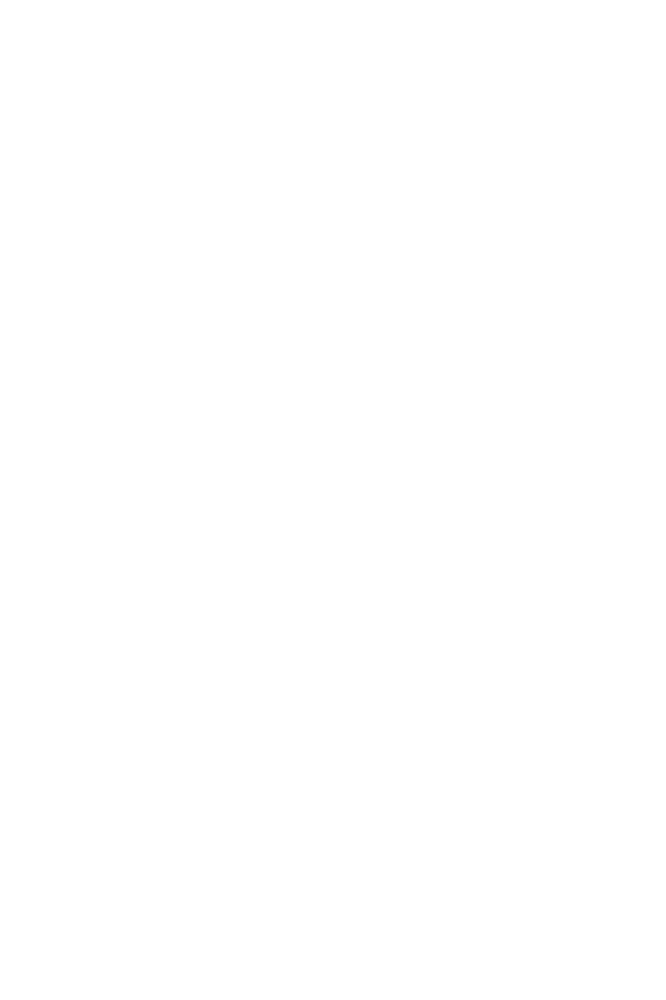

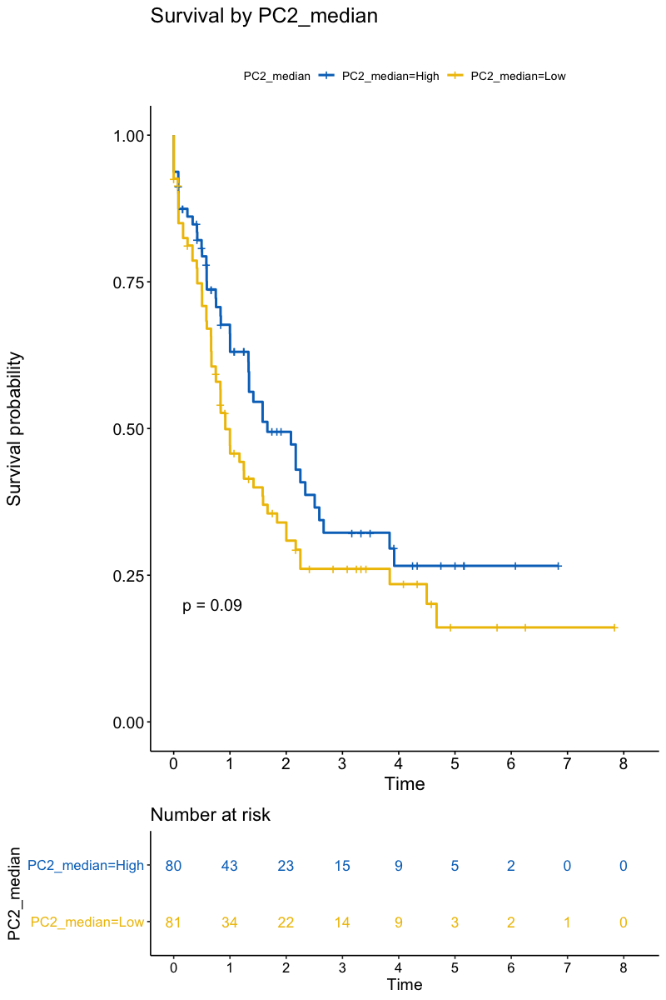

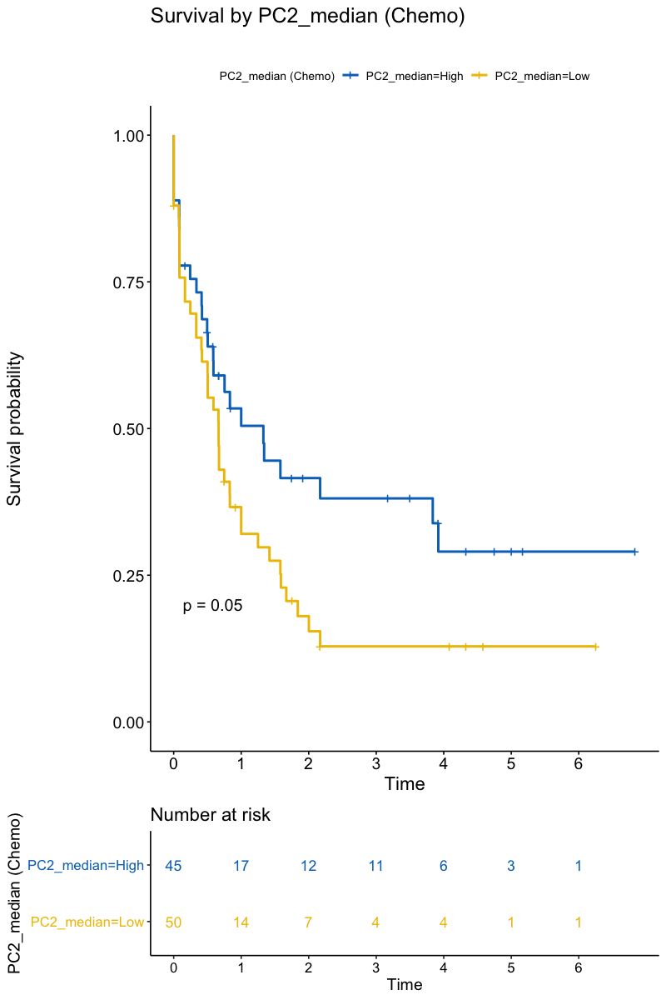

In [1493]:
%%R -w 8 -h 12 --units in -r 100

## Fit survival curves
survfit(Surv(time, status) ~ PC2_median, data = tcga_obs, type = 'kaplan-meier') %>% get_survplot(., "PC2_median")
survfit(Surv(time, status) ~ PC2_median, data = tcga_obs %>% filter(Transplant == 'Chemo Only'), type = 'kaplan-meier') %>% get_survplot(., "PC2_median (Chemo)")

In [1494]:
newcat_corr = cat.obs[['LSPC-Quiescent-Absolute', 'LSPC-Primed-Absolute', 'LSPC-Cycle-Absolute',
                                 'GMP-like-Absolute', 'ProMono-like-Absolute', 'Mono-like-Absolute', 'cDC-like-Absolute',
                              'LSC17_Score', 'PC1', 'PC2', 'NMF1', 'NMF2', 'NMF3']].corr()
newcat_corr = newcat_corr.iloc[newcat_corr.index.str.contains('Absolute'),:].iloc[:,~newcat_corr.index.str.contains('Absolute')]
newcat_corr.style.background_gradient(cmap='coolwarm')

,LSC17_Score,PC1,PC2,NMF1,NMF2,NMF3
LSPC-Quiescent-Absolute,0.489629,-0.386970,0.536811,0.707977,-0.260797,-0.389067
LSPC-Primed-Absolute,0.336311,-0.373243,0.461619,0.545560,-0.298297,-0.396472
LSPC-Cycle-Absolute,0.173851,-0.327290,-0.029100,0.152764,-0.339909,0.004522
GMP-like-Absolute,-0.335442,0.889924,0.066348,-0.606184,0.885646,-0.233960
ProMono-like-Absolute,-0.244510,0.055786,-0.194238,-0.254545,-0.006148,0.113894
Mono-like-Absolute,-0.140729,-0.010682,-0.763685,-0.482980,-0.164767,0.730467
cDC-like-Absolute,-0.193238,-0.122413,-0.589705,-0.246411,-0.208157,0.663528


In [1394]:
newcat = cat.copy()
newcat.obs = newcat.obs[['Cohort', 'Cluster', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'NMF1', 'NMF2', 'NMF3']]
#newcat.write_h5ad('Data/Hierarchy_Reference_3Cohorts.h5ad')

# Additional Analysis: Pediatric AML

In [108]:
cat = sc.read_h5ad('Data/Hierarchy_Reference_3Cohorts.h5ad')

In [120]:
# Load PedAML
def load_pedAML(dem_path, clin_path = "Data/Fig2_Cohort_Deconvolution/pedAML_clinical_data.csv"):
    
    # load CIBERSORT output
    dat = sc.read_csv(dem_path)
    dat = dat[:,~dat.var_names.isin(['P-value', 'Correlation', 'RMSE', 'Absolute score (sig.score)'])]
    dat.obs.index.rename('sample', inplace=True)
    dat.obs_names = dat.obs_names.str.replace(".", "-")
    dat.obs['Patient'] = dat.obs_names.str.slice(0, 16)
        
    # add clinical data 
    clin = pd.read_csv(clin_path, encoding="ISO-8859-1").dropna(how='all').set_index('Patient')
    dat.obs = dat.obs.merge(clin, left_on='Patient', right_index=True, how='left')
    
    # Absolute Scores
    absolute_scores = dat.to_df()
    absolute_scores.columns = absolute_scores.columns+'-Absolute'
    dat.obs = dat.obs.merge(absolute_scores, how = 'left', left_index=True, right_index=True)
    
    # Relative Scores (tumor only)
    relative_scores = dat.to_df()
    relative_scores = relative_scores.iloc[:,~relative_scores.columns.isin(['B', 'Plasma', 'T', 'CTL', 'NK', 'cDC', 'Monocyte', 'lateEry'])]
    relative_scores = (relative_scores.transpose() / relative_scores.sum(axis=1).transpose()).transpose()
    relative_scores.columns = relative_scores.columns+'-Relative'
    dat.obs = dat.obs.merge(relative_scores, how = 'left', left_index=True, right_index=True)
    
    return dat

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  
... storing 'Patient' as categorical
... storing 'Gender' as categorical
... storing 'Race' as categorical
... storing 'Ethnicity' as categorical
... storing 'First Event' as categorical
... storing 'Vital Status' as categorical
... storing 'Protocol' as categorical
... storing 'CNS disease' as categorical
... storing 'Chloroma' as categorical
... storing 'FAB Category' as categorical
... storing 't(6;9)' as categorical
... storing 't(8;21)' as categorical
... storing 't(3;5)(q25;q34)' as categorical
... storing 't(6;11)(q27;q23)' as categorical
... storing 't(9;11)(p22;q23)' as categorical
... storing 't(10;11)(p11.2;q23)' as categorical
... storing 't(11:19)(q23:p13.1)' as categorical
... storing 'inv(

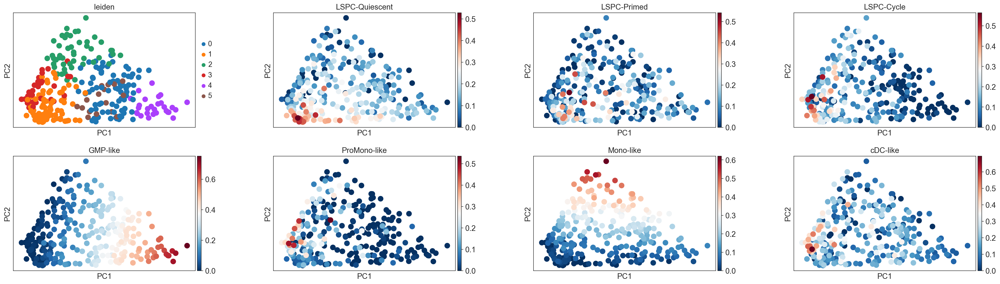

In [121]:
pedAML = load_pedAML("Data/Fig2_Cohort_Deconvolution/CIBERSORTx_Results_TARGET_pedAML.csv")
pedAML = process_fractions(pedAML, res=0.4)

In [122]:
pedAML.obs['InductionFailure'] = np.where(pedAML.obs['Refractory Timepoint sent for Induction Failure Project'] != 'nan', "Induction Failure", "CR")

In [125]:
pedAML.obs['InductionFailure'].value_counts()

CR                   257
Induction Failure     30
Name: InductionFailure, dtype: int64

### Ingest

In [115]:
# combine pedAML with ref cohorts and batch correct
temp = pedAML.concatenate(cat, index_unique=None)
sc.pp.combat(temp, key='batch')

# now project pedAML onto ref cohorts
sc.tl.ingest(temp, cat, embedding_method='pca', obs='Cluster')
temp.obs['PC1'] = temp.obsm['X_pca'][:,0]
temp.obs['PC2'] = temp.obsm['X_pca'][:,1]
pedAML = temp[temp.obs.batch=="0"]
pedAML.obsm['X_pca'][:,1] = -pedAML.obsm['X_pca'][:,1]

... storing 'Patient' as categorical
... storing 'Gender' as categorical
... storing 'Race' as categorical
... storing 'Ethnicity' as categorical
... storing 'First Event' as categorical
... storing 'Vital Status' as categorical
... storing 'Protocol' as categorical
... storing 'CNS disease' as categorical
... storing 'Chloroma' as categorical
... storing 'FAB Category' as categorical
... storing 't(6;9)' as categorical
... storing 't(8;21)' as categorical
... storing 't(3;5)(q25;q34)' as categorical
... storing 't(6;11)(q27;q23)' as categorical
... storing 't(9;11)(p22;q23)' as categorical
... storing 't(10;11)(p11.2;q23)' as categorical
... storing 't(11:19)(q23:p13.1)' as categorical
... storing 'inv(16)' as categorical
... storing 'del5q' as categorical
... storing 'del7q' as categorical
... storing 'del9q' as categorical
... storing 'monosomy 5' as categorical
... storing 'monosomy 7' as categorical
... storing 'trisomy 8' as categorical
... storing 'trisomy 21' as categorical
...

In [116]:
sns.set_style('white')

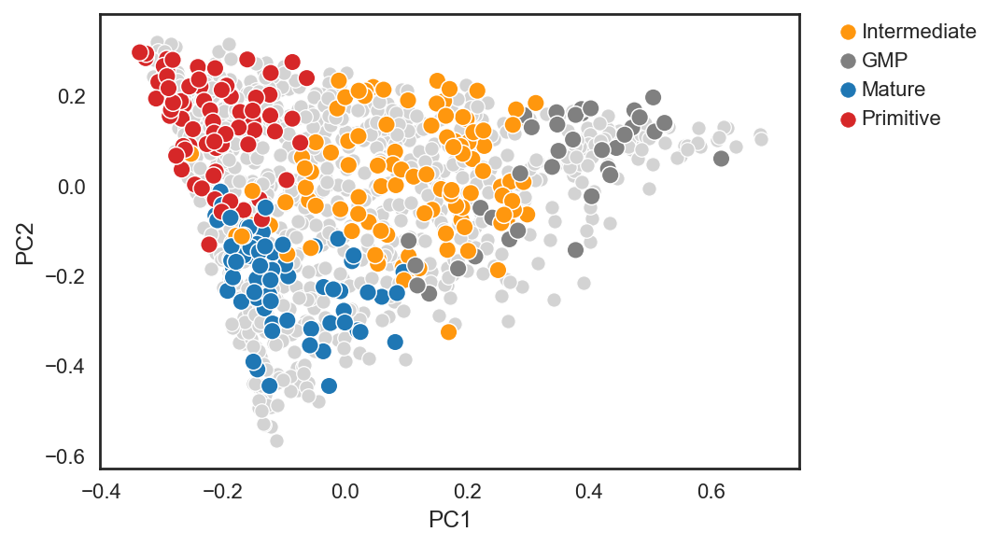

In [1547]:
combined = cat.obs[['PC1', 'PC2']].append(pedAML.obs[['PC1', 'PC2', 'InductionFailure', 'Cluster']])
                                                                    
sns.scatterplot(x=combined.PC1, y=combined.PC2, color='lightgrey')
sns.scatterplot(x=combined.PC1, y=combined.PC2, hue = combined['Cluster'],  palette=['#FF970e', '#808080', '#1f77b4', '#d62728'], s=70)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)

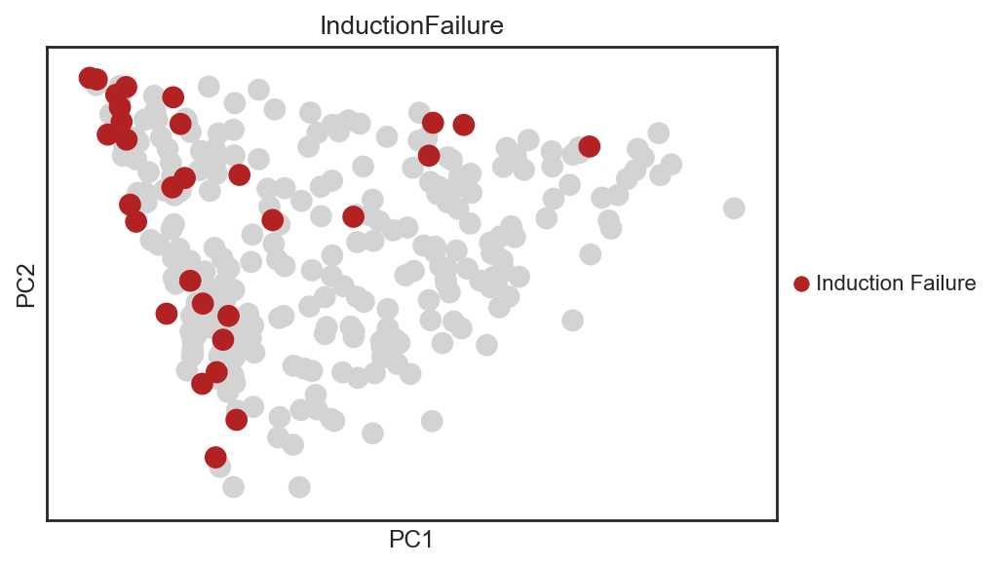

In [1544]:
sc.pl.pca(pedAML, color=['InductionFailure'], groups = ['Induction Failure'])

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 19.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/andyzeng/opt/anaconda3/lib/python3.7/si

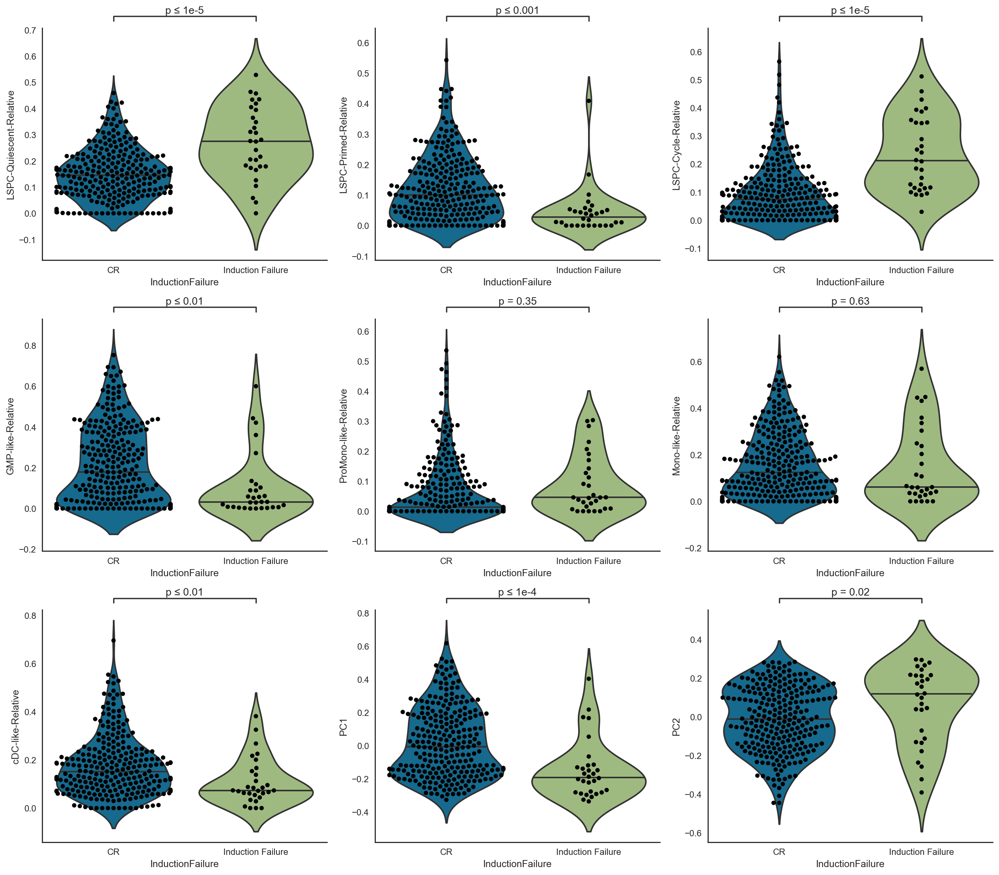

In [1536]:
adata = pedAML
grouping = "InductionFailure"
groupA = "CR"
groupB = "Induction Failure"

plt.figure(figsize=[16, 14])
plt.subplot(3,3,1)
violin_category(adata, grouping, 'LSPC-Quiescent-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,2)
violin_category(adata, grouping, 'LSPC-Primed-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,3)
violin_category(adata, grouping, 'LSPC-Cycle-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,4)
violin_category(adata, grouping, 'GMP-like-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,5)
violin_category(adata, grouping, 'ProMono-like-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,6)
violin_category(adata, grouping, 'Mono-like-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,7)
violin_category(adata, grouping, 'cDC-like-Relative', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,8)
violin_category(adata, grouping, 'PC1', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.subplot(3,3,9)
violin_category(adata, grouping, 'PC2', order=[groupA, groupB], boxpairlist=[(groupA, groupB)], textformat='simple')
plt.tight_layout()

### Pediatric AML Cluster Survival 

In [1537]:
pedAML_main = pedAML[pedAML.obs['InductionFailure'] == 'CR']

/Users/andyzeng/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2492: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [1538]:
pedAML_noSCT = pedAML_main[pedAML_main.obs['SCT in 1st CR'] == "No"]

In [1539]:
pedAML_obs = pedAML_main.obs
pedAML_obs['PC1_cat'] = np.where(pedAML_obs['PC1'] > pedAML_obs['PC1'].median(), "PC1 High", "PC1 Low")

pedAML_obs_noSCT = pedAML_noSCT.obs
pedAML_obs_noSCT['PC1_cat'] = np.where(pedAML_obs_noSCT['PC1'] > pedAML_obs_noSCT['PC1'].median(), "PC1 High", "PC1 Low")

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


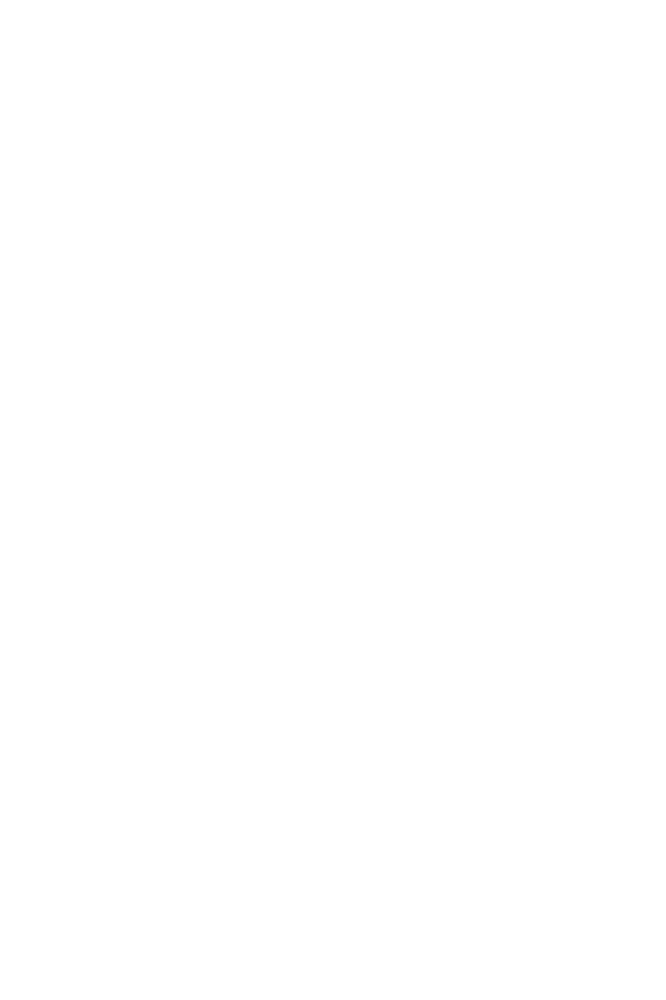

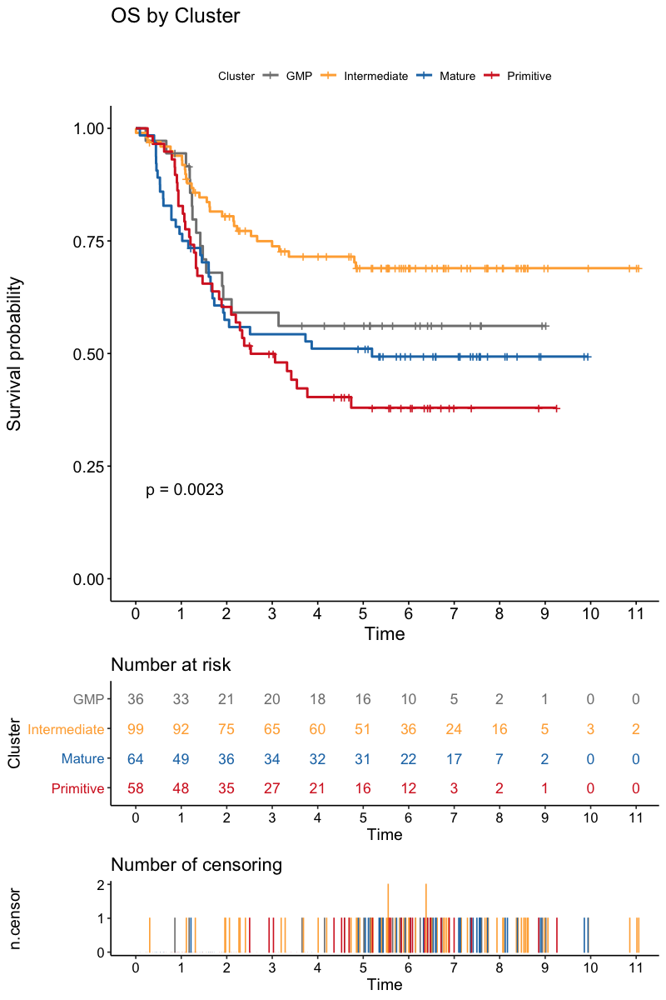

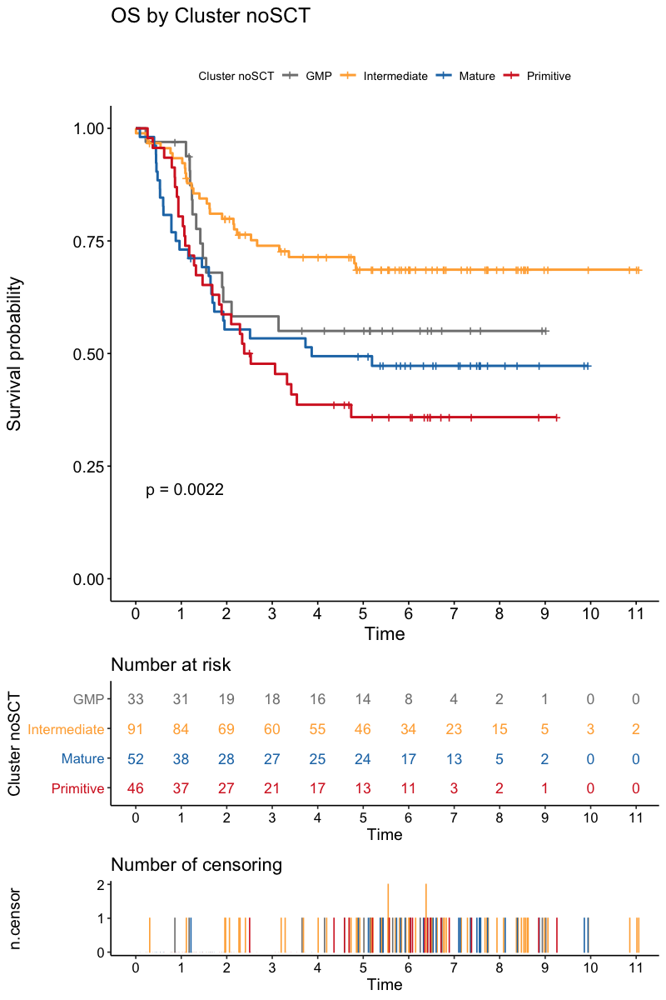

In [1541]:
%%R -i pedAML_obs -i pedAML_obs_noSCT -w 8 -h 12 --units in -r 100

# OS

# convert factors to chr
indx <- sapply(pedAML_obs, is.factor)
pedAML_obs[indx] <- lapply(pedAML_obs[indx], function(x) as.character(x))
# set time and status
pedAML_obs <- pedAML_obs %>% 
    mutate(time = `Overall Survival Time in Days` %>% as.numeric(), 
          status = if_else(`Vital Status` == "Dead", 1, 0))
    
# convert factors to chr
indx <- sapply(pedAML_obs_noSCT, is.factor)
pedAML_obs_noSCT[indx] <- lapply(pedAML_obs_noSCT[indx], function(x) as.character(x))
# set time and status
pedAML_obs_noSCT <- pedAML_obs_noSCT %>% 
    mutate(time = `Overall Survival Time in Days` %>% as.numeric(), 
          status = if_else(`Vital Status` == "Dead", 1, 0))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("OS by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, legend.labs = labels, 
               pval = TRUE, palette = c('#808080', '#FFAD41', '#1f77b4', '#d62728'),
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}#ff7f0e

# Fit survival curves to Cluster
survfit(Surv(time, status) ~ Cluster, data = pedAML_obs, type = 'kaplan-meier') %>% 
    get_survplot(., "Cluster", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
    
survfit(Surv(time, status) ~ Cluster, data = pedAML_obs_noSCT, type = 'kaplan-meier') %>% 
    get_survplot(., "Cluster noSCT", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
    

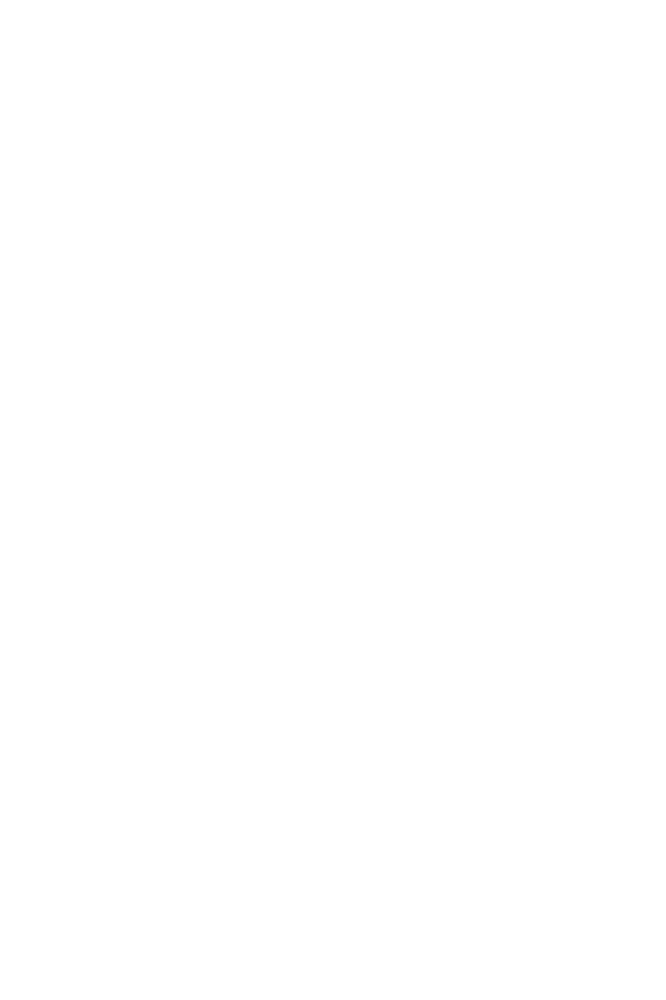

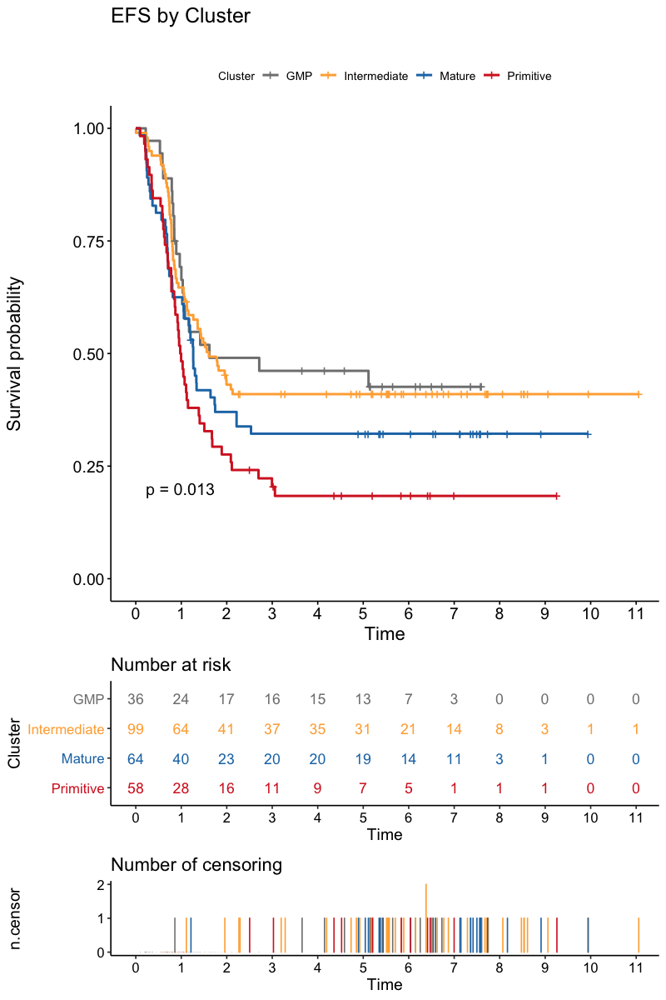

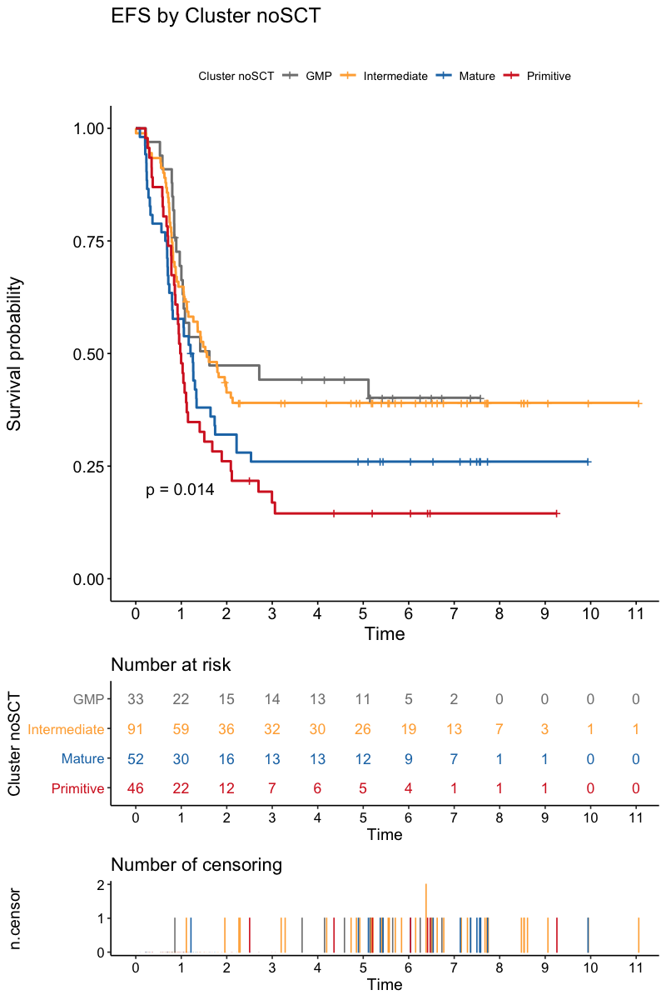

In [1543]:
%%R -w 8 -h 12 --units in -r 100

# OS

# convert factors to chr
indx <- sapply(pedAML_obs, is.factor)
pedAML_obs[indx] <- lapply(pedAML_obs[indx], function(x) as.character(x))
# set time and status
pedAML_obs <- pedAML_obs %>% 
    mutate(time = `Event Free Survival Time in Days` %>% as.numeric(), 
          status = if_else(`First Event` == "Censored", 0, 1))
    
# convert factors to chr
indx <- sapply(pedAML_obs_noSCT, is.factor)
pedAML_obs_noSCT[indx] <- lapply(pedAML_obs_noSCT[indx], function(x) as.character(x))
# set time and status
pedAML_obs_noSCT <- pedAML_obs_noSCT %>% 
    mutate(time = `Event Free Survival Time in Days` %>% as.numeric(), 
          status = if_else(`First Event` == "Censored", 0, 1))
    
get_survplot <- function(fit, cat_name, labels){
    gg <- ggsurvplot(fit, title = paste0("EFS by ", cat_name, "\n"),
               font.title = 18, font.x =  16,
               font.y = 16, font.tickslab = 14, 
               xscale = 'd_y', break.time.by=365.1,
               legend.title = cat_name, legend.labs = labels, 
               pval = TRUE, palette = c('#808080', '#FFAD41', '#1f77b4', '#d62728'),
               risk.table = TRUE, risk.table.y.text.col = TRUE,
               risk.table.col = 'strata', risk.table.height = 0.2, 
               ncensor.plot = TRUE, ncensor.plot.height = 0.15) 
    
    #ggsave(paste0("Figures/TCGA_Survival_by_", cat_name, "_newcolors.png"), print(gg), width = 8, height = 10, dpi = 'retina')
    print(gg)
}#ff7f0e

# Fit survival curves to Cluster
survfit(Surv(time, status) ~ Cluster, data = pedAML_obs, type = 'kaplan-meier') %>% 
    get_survplot(., "Cluster", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
    
survfit(Surv(time, status) ~ Cluster, data = pedAML_obs_noSCT, type = 'kaplan-meier') %>% 
    get_survplot(., "Cluster noSCT", c('GMP', 'Intermediate', 'Mature', 'Primitive'))
    